# Download and Save Dataset in Drive

In [ ]:
# Download dataset from URL
!wget --no-check-certificate \
      https://www.muratkoklu.com/datasets/vtdhnd12.php

In [ ]:
!ls

sample_data  vtdhnd12.php


In [ ]:
# Unzip the file
!unzip -q vtdhnd12.php

In [ ]:
!ls


drive  Pistachio_Image_Dataset	sample_data  vtdhnd12.php


In [ ]:
#Save the Dataset in Colab
save_path = "/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project"
!cp -r Pistachio_Image_Dataset "/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project"

# Import Libraries and Mount Drive

In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import libraries
import warnings
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from imblearn.over_sampling import SMOTE
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Flatten
from tensorflow.keras import layers, models
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.feature_selection import RFE
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.exceptions import ConvergenceWarning
from collections import Counter
from mpl_toolkits.mplot3d import Axes3D
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture

# Read the dataset

## Feature Dataset

In [ ]:
pistachio_path = "/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/Pistachio_28_Features_Dataset/Pistachio_28_Features_Dataset.xlsx"


In [ ]:
pistachio_df = pd.read_excel(pistachio_path)

## Image Dataset (Loading and Preprocessing)

In [ ]:
# Path to Image Dataset
image_path = "/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/Pistachio_Image_Dataset"


In [ ]:
# Load dataset
dataset = tf.keras.utils.image_dataset_from_directory(
    image_path,
    image_size=(224, 224),  # VGG16 input size
    batch_size=None,        # Load everything into memory
    shuffle=True
)
# Extract images and labels into memory
images, labels = zip(*dataset)

# Convert to tensors
images = tf.convert_to_tensor(images, dtype=tf.float32) / 255.0  # Normalization
labels = tf.convert_to_tensor(labels)


Found 2148 files belonging to 2 classes.


# Data Understanding

In [ ]:
# First five rows
pistachio_df.head()

,Area,Perimeter,Major_Axis,Minor_Axis,Eccentricity,Eqdiasq,Solidity,Convex_Area,Extent,Aspect_Ratio,...,StdDev_RR,StdDev_RG,StdDev_RB,Skew_RR,Skew_RG,Skew_RB,Kurtosis_RR,Kurtosis_RG,Kurtosis_RB,Class
0,63391,1568.405,390.3396,236.7461,0.7951,284.0984,0.8665,73160,0.6394,1.6488,...,17.7206,19.6024,21.1342,0.4581,0.6635,0.7591,2.9692,3.0576,2.9542,Kirmizi_Pistachio
1,68358,1942.187,410.8594,234.7525,0.8207,295.0188,0.8765,77991,0.6772,1.7502,...,26.7061,27.2112,25.1035,-0.3847,-0.2713,-0.2927,1.9807,2.1006,2.2152,Kirmizi_Pistachio
2,73589,1246.538,452.3630,220.5547,0.8731,306.0987,0.9172,80234,0.7127,2.0510,...,19.0129,20.0703,20.7006,-0.6014,-0.4500,0.2998,3.5420,3.6856,4.1012,Kirmizi_Pistachio
3,71106,1445.261,429.5291,216.0765,0.8643,300.8903,0.9589,74153,0.7028,1.9879,...,18.1773,18.7152,29.7883,-0.6943,-0.6278,-0.7798,2.8776,2.8748,2.8953,Kirmizi_Pistachio
4,80087,1251.524,469.3783,220.9344,0.8823,319.3273,0.9657,82929,0.7459,2.1245,...,23.4298,24.0878,23.1157,-0.9287,-0.8134,-0.4970,2.9915,2.8813,2.7362,Kirmizi_Pistachio


In [ ]:
# Dataset shape
pistachio_df.shape

(2148, 29)

In [ ]:
# Attributes name and type
pistachio_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2148 entries, 0 to 2147
Data columns (total 29 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Area           2148 non-null   int64  
 1   Perimeter      2148 non-null   float64
 2   Major_Axis     2148 non-null   float64
 3   Minor_Axis     2148 non-null   float64
 4   Eccentricity   2148 non-null   float64
 5   Eqdiasq        2148 non-null   float64
 6   Solidity       2148 non-null   float64
 7   Convex_Area    2148 non-null   int64  
 8   Extent         2148 non-null   float64
 9   Aspect_Ratio   2148 non-null   float64
 10  Roundness      2148 non-null   float64
 11  Compactness    2148 non-null   float64
 12  Shapefactor_1  2148 non-null   float64
 13  Shapefactor_2  2148 non-null   float64
 14  Shapefactor_3  2148 non-null   float64
 15  Shapefactor_4  2148 non-null   float64
 16  Mean_RR        2148 non-null   float64
 17  Mean_RG        2148 non-null   float64
 18  Mean_RB 

In [ ]:
# Summary of Statistics
pistachio_df.describe()

,Area,Perimeter,Major_Axis,Minor_Axis,Eccentricity,Eqdiasq,Solidity,Convex_Area,Extent,Aspect_Ratio,...,Mean_RB,StdDev_RR,StdDev_RG,StdDev_RB,Skew_RR,Skew_RG,Skew_RB,Kurtosis_RR,Kurtosis_RG,Kurtosis_RB
count,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,...,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000,2148.000000
mean,79950.655493,1425.971751,446.248968,238.311842,0.840219,317.919173,0.940093,85015.839851,0.716067,1.898154,...,191.995311,21.380084,22.591454,22.427056,-0.735243,-0.615580,-0.367142,3.054000,2.903015,2.940572
std,13121.737799,375.565503,32.445304,30.310695,0.048759,26.908600,0.050452,13154.919327,0.052532,0.240100,...,13.030505,3.127813,3.622222,3.926325,0.384584,0.389219,0.426964,0.733993,0.651383,0.750171
min,29808.000000,858.363000,320.344500,133.509600,0.504900,194.814600,0.588000,37935.000000,0.427200,1.158500,...,146.787600,10.611100,11.985400,11.197100,-1.931600,-1.658200,-2.348600,1.662400,1.665500,1.522500
25%,71936.750000,1170.996250,426.508750,217.875825,0.817500,302.642850,0.919850,76467.000000,0.687000,1.736375,...,182.930675,19.253550,20.036675,19.722425,-0.990900,-0.875975,-0.645800,2.509700,2.437400,2.449425
50%,79905.500000,1262.785500,448.574750,236.416350,0.849650,318.965300,0.954150,85075.500000,0.726500,1.896250,...,192.036350,21.425100,22.523250,22.276900,-0.756600,-0.653050,-0.424550,2.941750,2.807050,2.783350
75%,89030.500000,1607.906250,468.509400,257.760150,0.875200,336.685525,0.976925,93893.500000,0.753600,2.067025,...,201.097725,23.695900,25.241900,25.140125,-0.502500,-0.405000,-0.158400,3.446500,3.247400,3.224650
max,124008.000000,2755.049100,541.966100,383.046100,0.946000,397.356100,0.995100,132478.000000,0.820400,3.085800,...,235.000700,30.838300,33.614600,42.756600,1.865400,2.257600,1.852100,8.890600,10.453900,11.533900


In [ ]:
# Class Disturbution
pistachio_df['Class'].value_counts()

,count
Class,
Kirmizi_Pistachio,1232
Siirt_Pistachio,916


In [ ]:
# Class disturbution in percentage
pistachio_df['Class'].value_counts(normalize=True)

,proportion
Class,
Kirmizi_Pistachio,0.573557
Siirt_Pistachio,0.426443


## Corrolation Analysis

In [ ]:
# Encode the class
le = LabelEncoder()
pistachio_df['Class'] = le.fit_transform(pistachio_df['Class'])
# Corrolation Analysis
pistachio_df.corr()

,Area,Perimeter,Major_Axis,Minor_Axis,Eccentricity,Eqdiasq,Solidity,Convex_Area,Extent,Aspect_Ratio,...,StdDev_RR,StdDev_RG,StdDev_RB,Skew_RR,Skew_RG,Skew_RB,Kurtosis_RR,Kurtosis_RG,Kurtosis_RB,Class
Area,1.000000,0.115941,0.697782,0.795881,-0.358892,0.997399,0.363959,0.943877,0.331784,-0.424025,...,0.024021,0.032112,-0.030652,-0.375466,-0.375748,-0.193497,0.216112,0.135427,-0.030522,0.589226
Perimeter,0.115941,1.000000,0.094296,0.390740,-0.334483,0.113631,-0.671046,0.364474,-0.403916,-0.312373,...,0.058104,0.126536,0.022171,0.197617,0.129641,0.057866,-0.246827,-0.190720,-0.081029,0.145290
Major_Axis,0.697782,0.094296,1.000000,0.272578,0.298836,0.705333,0.247822,0.661892,0.186830,0.265049,...,0.057641,0.046191,0.065028,-0.273309,-0.246175,-0.120786,0.206791,0.150055,0.016733,0.136845
Minor_Axis,0.795881,0.390740,0.272578,1.000000,-0.816731,0.793155,-0.085556,0.890003,0.047442,-0.839078,...,0.023901,0.061692,-0.071212,-0.237843,-0.277873,-0.149111,0.059061,0.015342,-0.096175,0.668126
Eccentricity,-0.358892,-0.334483,0.298836,-0.816731,1.000000,-0.352723,0.257060,-0.482713,0.080967,0.943751,...,0.026200,-0.018774,0.116054,0.064266,0.118885,0.061233,0.055586,0.060771,0.091782,-0.546759
Eqdiasq,0.997399,0.113631,0.705333,0.793155,-0.352723,1.000000,0.372779,0.940651,0.340073,-0.423318,...,0.039178,0.045066,-0.017884,-0.383692,-0.383335,-0.197613,0.212359,0.130611,-0.038081,0.577300
Solidity,0.363959,-0.671046,0.247822,-0.085556,0.257060,0.372779,1.000000,0.042000,0.678599,0.177830,...,-0.026426,-0.085937,-0.024788,-0.367507,-0.304009,-0.145714,0.315469,0.223997,0.053262,0.125347
Convex_Area,0.943877,0.364474,0.661892,0.890003,-0.482713,0.940651,0.042000,1.000000,0.122881,-0.522637,...,0.041743,0.071479,-0.019823,-0.282384,-0.305124,-0.162942,0.117510,0.061541,-0.057531,0.584618
Extent,0.331784,-0.403916,0.186830,0.047442,0.080967,0.340073,0.678599,0.122881,1.000000,0.023303,...,0.092330,0.047355,0.049950,-0.275952,-0.247209,-0.153359,0.138206,0.059725,-0.052924,0.100200
Aspect_Ratio,-0.424025,-0.312373,0.265049,-0.839078,0.943751,-0.423318,0.177830,-0.522637,0.023303,1.000000,...,-0.025651,-0.061186,0.081160,0.111716,0.163461,0.095188,0.051779,0.069905,0.120274,-0.581469


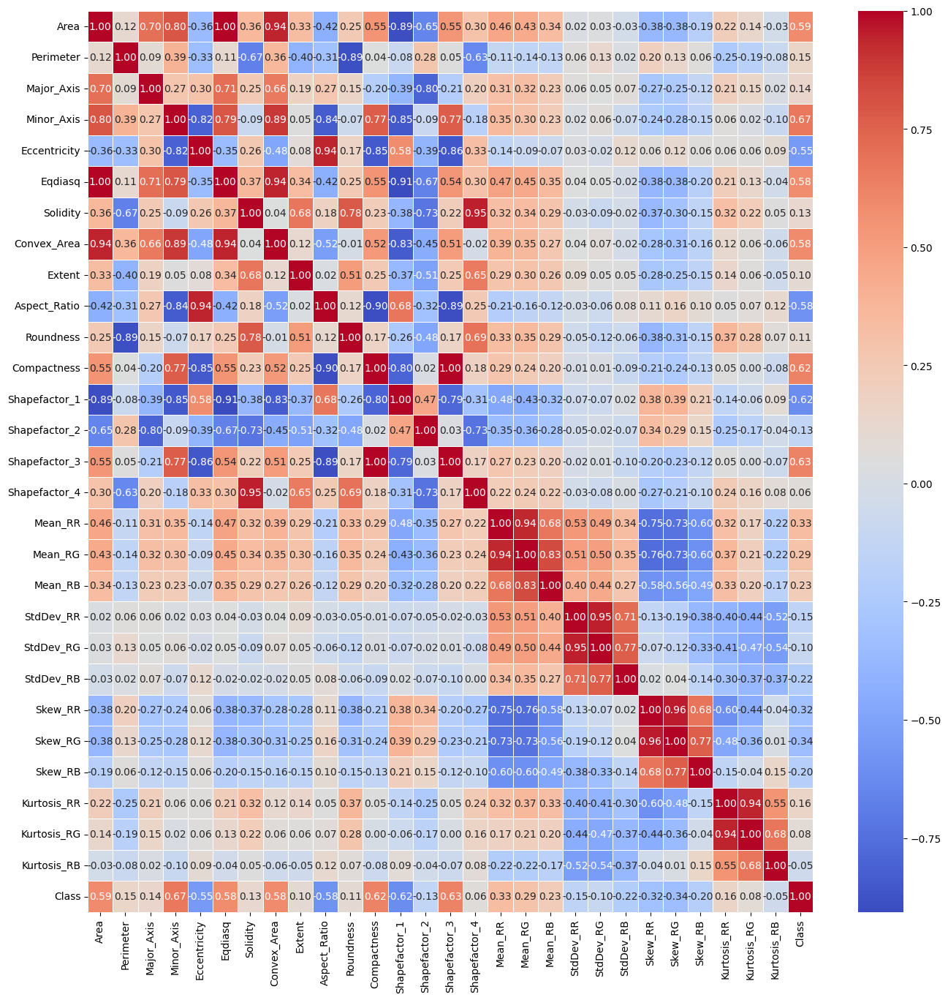

In [ ]:
plt.figure(figsize=(16, 16))
sns.heatmap(pistachio_df.corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.show()

We have 3 sets of attributes:
morphological Features (12 Features)
1. Area
2. Perimeter
3. Major_Axis
4. Minor_Axis
5. Eccentricity
6. Eqdiasq
7. Solidity
8. Convex_Area
9. Extent
10. Aspect_Ratio
11. Roundness
12. Compactness

In [ ]:
# Morphological features + class
morphological_features = ['Area', 'Perimeter', 'Major_Axis', 'Minor_Axis', 'Eccentricity', 'Eqdiasq', 'Solidity', 'Convex_Area', 'Extent', 'Aspect_Ratio', 'Roundness', 'Compactness','Class']

Shape Features (4 Features)
13. Shapefactor_1
14. Shapefactor_2
15. Shapefactor_3
16. Shapefactor_4

In [ ]:
# Shape features and Class
shape_features = ['Shapefactor_1', 'Shapefactor_2', 'Shapefactor_3', 'Shapefactor_4','Class']

Color Features (12 Features)
17. Mean_RR
18. Mean_RG
19. Mean_RB
20. StdDev_RR
21. StdDev_RG
22. StdDev_RB
213. Skew_RR
24. Skew_RG
25. Skew_RB
26. Kurtosis_RR
27. Kurtosis_RG
28. Kurtosis_RB

In [ ]:
# Color Features and Class
color_features = ['Mean_RR', 'Mean_RG', 'Mean_RB', 'StdDev_RR', 'StdDev_RG', 'StdDev_RB', 'Skew_RR', 'Skew_RG', 'Skew_RB', 'Kurtosis_RR', 'Kurtosis_RG', 'Kurtosis_RB','Class']

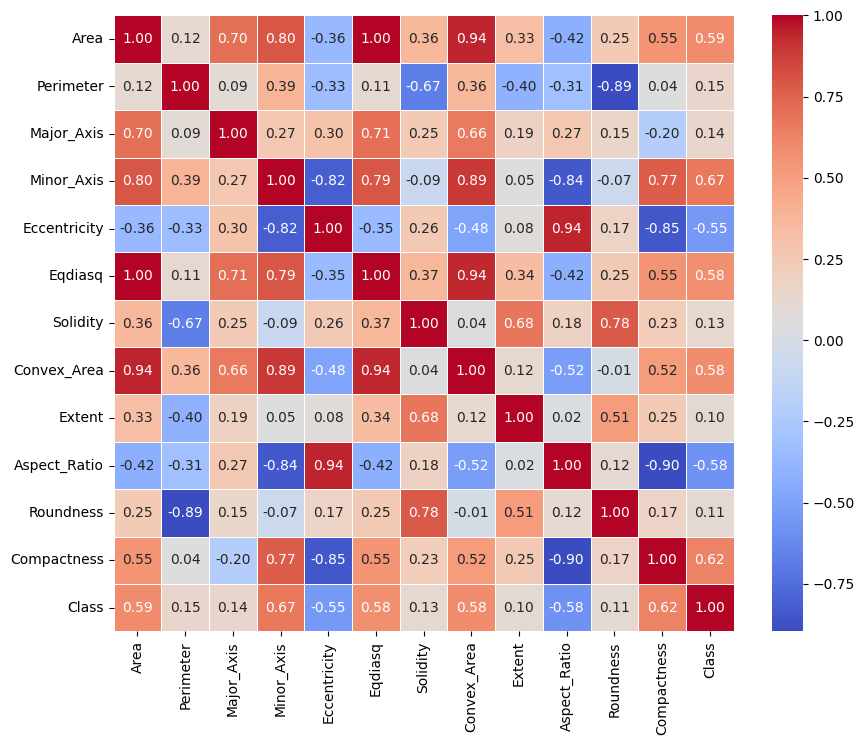

In [ ]:
# Heat Map for Each set of feature
plt.figure(figsize=(10, 8))
sns.heatmap(pistachio_df[morphological_features].corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.show()


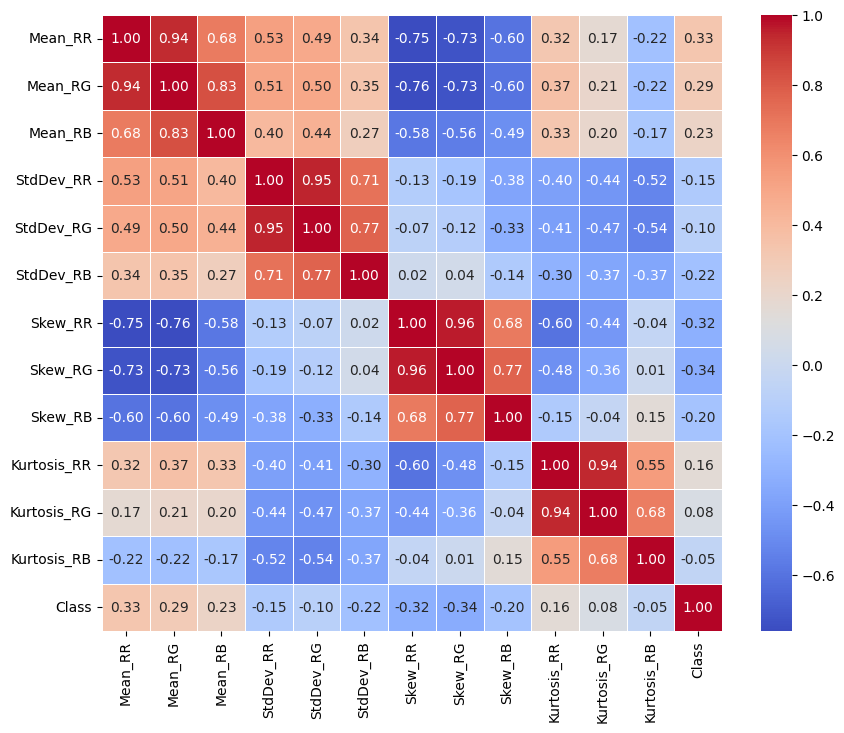

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(pistachio_df[color_features].corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.show()

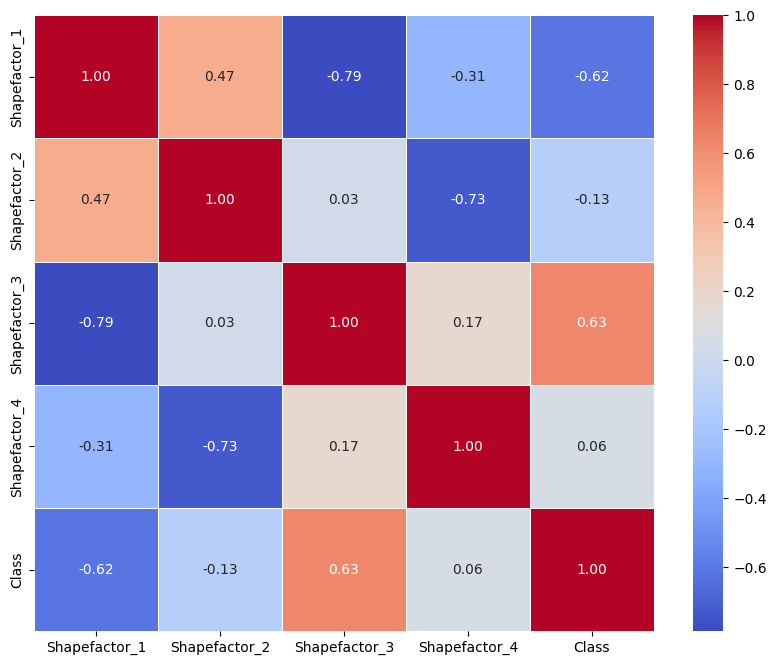

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(pistachio_df[shape_features].corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.show()

In [ ]:
# Attributes with more than 0.8 corrolation
# Create a mask to find correlations above 0.8 or below -0.8 (absolute value)
corr_matrix = pistachio_df.corr()
high_corr = corr_matrix[abs(corr_matrix) > 0.8]

# Remove the self-correlations (diagonal elements)
high_corr = high_corr.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Display the pairs with high correlation
print(high_corr.stack())

Area          Eqdiasq          0.997399
              Convex_Area      0.943877
              Shapefactor_1   -0.892493
Perimeter     Roundness       -0.891777
Minor_Axis    Eccentricity    -0.816731
              Convex_Area      0.890003
              Aspect_Ratio    -0.839078
              Shapefactor_1   -0.851167
Eccentricity  Aspect_Ratio     0.943751
              Compactness     -0.846851
              Shapefactor_3   -0.855222
Eqdiasq       Convex_Area      0.940651
              Shapefactor_1   -0.906893
Solidity      Shapefactor_4    0.949501
Convex_Area   Shapefactor_1   -0.834649
Aspect_Ratio  Compactness     -0.896857
              Shapefactor_3   -0.892523
Compactness   Shapefactor_1   -0.801009
              Shapefactor_3    0.998625
Mean_RR       Mean_RG          0.937012
Mean_RG       Mean_RB          0.830093
StdDev_RR     StdDev_RG        0.948158
Skew_RR       Skew_RG          0.958768
Kurtosis_RR   Kurtosis_RG      0.942929
dtype: float64


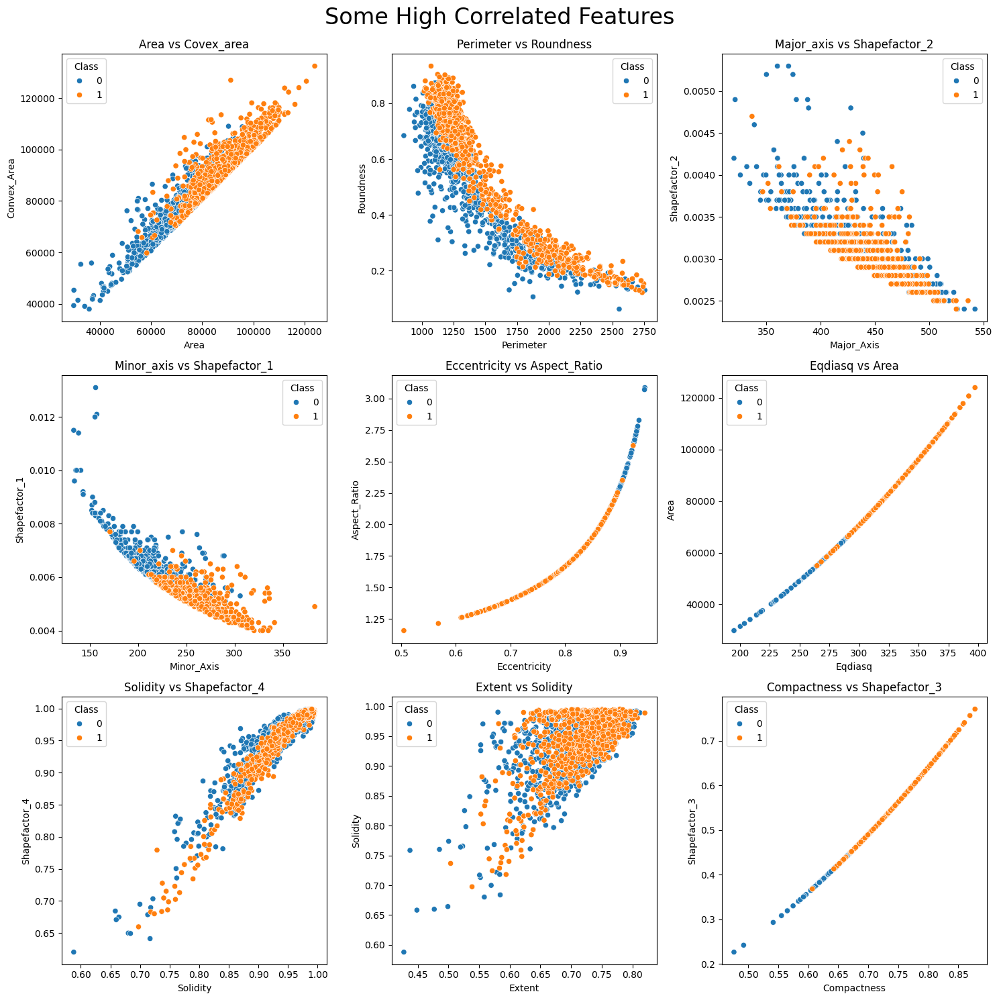

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))

sns.scatterplot(data=pistachio_df, x='Area', y='Convex_Area', hue='Class', ax=ax[0][0])
ax[0][0].set_title(f'Area vs Covex_area')
sns.scatterplot(data=pistachio_df, x='Perimeter', y='Roundness', hue='Class', ax=ax[0][1])
ax[0][1].set_title(f'Perimeter vs Roundness')
sns.scatterplot(data=pistachio_df, x='Major_Axis', y='Shapefactor_2', hue='Class', ax=ax[0][2])
ax[0][2].set_title(f'Major_axis vs Shapefactor_2')
sns.scatterplot(data=pistachio_df, x='Minor_Axis', y='Shapefactor_1', hue='Class', ax=ax[1][0])
ax[1][0].set_title(f'Minor_axis vs Shapefactor_1')
sns.scatterplot(data=pistachio_df, x='Eccentricity', y='Aspect_Ratio', hue='Class', ax=ax[1][1])
ax[1][1].set_title(f'Eccentricity vs Aspect_Ratio')
sns.scatterplot(data=pistachio_df, x='Eqdiasq', y='Area', hue='Class', ax=ax[1][2])
ax[1][2].set_title(f'Eqdiasq vs Area')
sns.scatterplot(data=pistachio_df, x='Solidity', y='Shapefactor_4', hue='Class', ax=ax[2][0])
ax[2][0].set_title(f'Solidity vs Shapefactor_4')
sns.scatterplot(data=pistachio_df, x='Extent', y='Solidity', hue='Class', ax=ax[2][1])
ax[2][1].set_title(f'Extent vs Solidity')
sns.scatterplot(data=pistachio_df, x='Compactness', y='Shapefactor_3', hue='Class', ax=ax[2][2])
ax[2][2].set_title(f'Compactness vs Shapefactor_3')

fig.suptitle('Some High Correlated Features', fontsize=24, y=0.99)
plt.tight_layout()
plt.show()

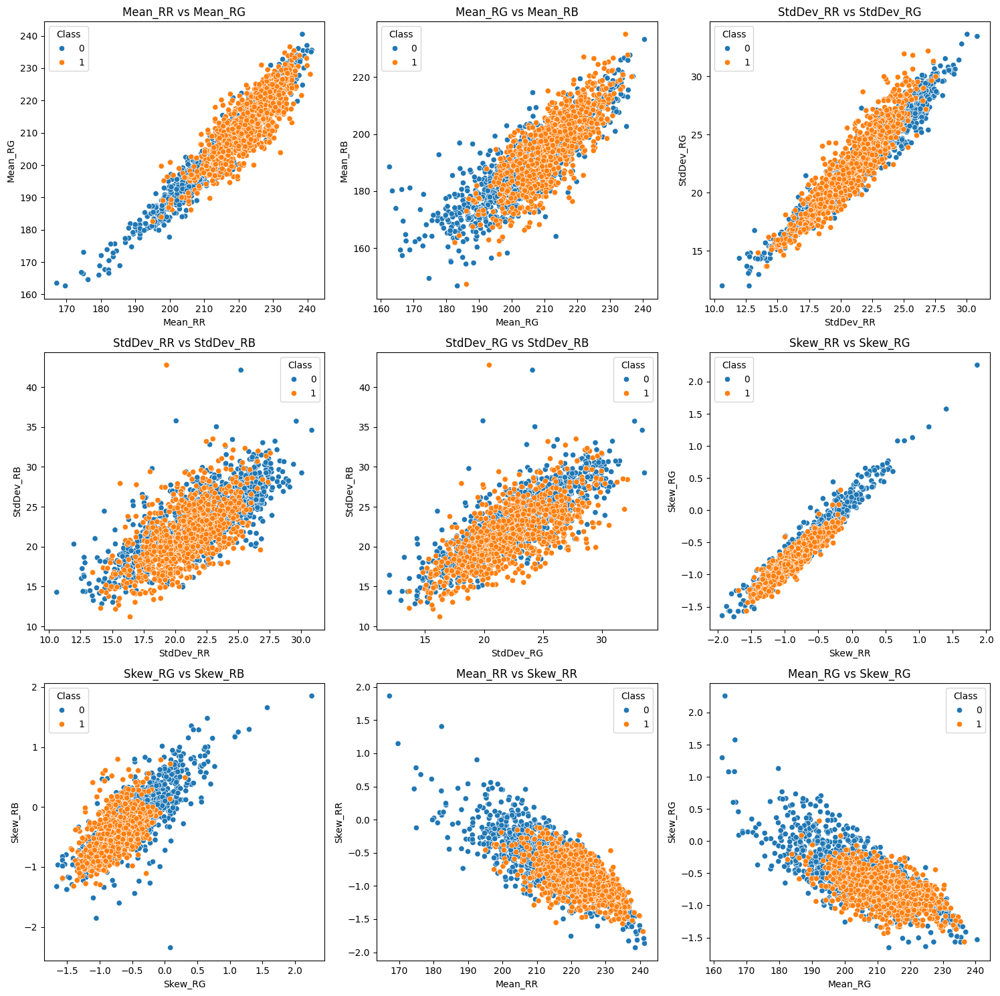

In [ ]:
ig, ax = plt.subplots(3, 3, figsize=(15, 15))

sns.scatterplot(data=pistachio_df, x='Mean_RR', y='Mean_RG', hue='Class', ax=ax[0][0])
ax[0][0].set_title(f'Mean_RR vs Mean_RG')

sns.scatterplot(data=pistachio_df, x='Mean_RG', y='Mean_RB', hue='Class', ax=ax[0][1])
ax[0][1].set_title(f'Mean_RG vs Mean_RB')

sns.scatterplot(data=pistachio_df, x='StdDev_RR', y='StdDev_RG', hue='Class', ax=ax[0][2])
ax[0][2].set_title(f'StdDev_RR vs StdDev_RG')

sns.scatterplot(data=pistachio_df, x='StdDev_RR', y='StdDev_RB', hue='Class', ax=ax[1][0])
ax[1][0].set_title(f'StdDev_RR vs StdDev_RB')

sns.scatterplot(data=pistachio_df, x='StdDev_RG', y='StdDev_RB', hue='Class', ax=ax[1][1])
ax[1][1].set_title(f'StdDev_RG vs StdDev_RB')

sns.scatterplot(data=pistachio_df, x='Skew_RR', y='Skew_RG', hue='Class', ax=ax[1][2])
ax[1][2].set_title(f'Skew_RR vs Skew_RG')

sns.scatterplot(data=pistachio_df, x='Skew_RG', y='Skew_RB', hue='Class', ax=ax[2][0])
ax[2][0].set_title(f'Skew_RG vs Skew_RB')

sns.scatterplot(data=pistachio_df, x='Mean_RR', y='Skew_RR', hue='Class', ax=ax[2][1])
ax[2][1].set_title(f'Mean_RR vs Skew_RR')

sns.scatterplot(data=pistachio_df, x='Mean_RG', y='Skew_RG', hue='Class', ax=ax[2][2])
ax[2][2].set_title(f'Mean_RG vs Skew_RG')

fig.suptitle('Highly Correlated Color Features', fontsize=24, y=0.99)
plt.tight_layout()
plt.show()

In [ ]:
# features = ['Mean_RR', 'Mean_RG', 'Mean_RB', 'StdDev_RR', 'StdDev_RG', 'StdDev_RB', 'Skew_RR', 'Skew_RG', 'Skew_RB', 'Kurtosis_RR', 'Kurtosis_RG', 'Kurtosis_RB']
# num_features = len(features)

# fig, ax = plt.subplots(num_features, num_features, figsize=(20, 20), sharex=False, sharey=False)

# for i in range(num_features):
#     for j in range(num_features):
#         if i != j:
#             sns.scatterplot(data=pistachio_df, x=features[i], y=features[j], hue='Class', ax=ax[i][j])
#             ax[i][j].set_title(f'{features[i]} vs {features[j]}')
#         else:
#             ax[i][j].axis('off')

# fig.suptitle('Class Separability in Color Features', fontsize=24, y=0.99)
# plt.tight_layout()
# plt.show()


## Image Dataset Exploration

In [ ]:
# Image shape
# Path to the dataset
image_path = "/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/Pistachio_Image_Dataset"

# Get the first image path
class_folders = os.listdir(image_path)
first_class = class_folders[0]
first_image_path = os.path.join(image_path, first_class, os.listdir(os.path.join(image_path, first_class))[0])


img = cv2.imread(first_image_path)
print("Image shape (height, width, channels):", img.shape)

Image shape (height, width, channels): (600, 600, 3)


By Changing the index and checking different images we can see all the images have the shape of (600,600,3)

In [ ]:
# Original images max value
img_max_value = np.max(img)
print("Maximum value in the image:", img_max_value)


Maximum value in the image: 255


#Data preprocessing

## Subset Selection

In [ ]:
# Read dataset
pistachio_df = pd.read_excel(pistachio_path)

In [ ]:
# Using Highly Corrolated
def detect_corr(df, threshold=0.8):
    X = df.drop('Class', axis=1)
    # Compute correlation matrix
    corr_matrix = X.corr().abs()  # Absolute correlation values

    # Define a threshold (e.g., 0.9)
    threshold = 0.9

    # Identify columns to drop
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    return to_drop


In [ ]:
# Columns with more than 99% of corrolation
high_corr=detect_corr(pistachio_df, threshold= 0.99)
print(high_corr)

['Eqdiasq', 'Convex_Area', 'Aspect_Ratio', 'Shapefactor_1', 'Shapefactor_3', 'Shapefactor_4', 'Mean_RG', 'StdDev_RG', 'Skew_RG', 'Kurtosis_RG']


In [ ]:
# Delete highly corrolated
pistachio_df = pistachio_df.drop(columns=high_corr, axis=1)

In [ ]:
# RFE Method
def RFE_Analysis(df, target_column, number_of_features=18, model='lr'):
    """
    Perform Recursive Feature Elimination (RFE) for feature selection.

    Parameters:
    df (pd.DataFrame): The dataset including features and target.
    target_column (str): The name of the target variable.
    number_of_features (int): Number of features to select. Default is 10.
    model (str): Model to use for RFE ('lr' for Logistic Regression, 'svm' for Support Vector Machine).

    Returns:
    list: Selected feature names.
    """

    # Extract features and target
    X = df.drop(columns=[target_column])
    y = df[target_column]

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Choose model
    if model == 'lr':
        estimator = LogisticRegression(max_iter=1000)
    elif model == 'svm':
        estimator = SVC(kernel='linear')  # Linear kernel for feature importance
    else:
        raise ValueError("Invalid model choice. Use 'lr' for Logistic Regression or 'svm' for SVM.")

    # Initialize and fit RFE
    rfe = RFE(estimator, n_features_to_select=number_of_features)
    rfe.fit(X_scaled, y)

    # Get selected features
    selected_features = X.columns[rfe.support_]

    return list(selected_features)


In [ ]:
# RFE Analysis
selected_features_svm = RFE_Analysis(pistachio_df, 'Class', number_of_features=13, model='svm')
deleted_features_svm = [feature for feature in pistachio_df.columns if feature not in selected_features_svm]
print(f'selected features by svm: {selected_features_svm} \nDeleted features: {deleted_features_svm} ')

selected features by svm: ['Area', 'Perimeter', 'Major_Axis', 'Minor_Axis', 'Eccentricity', 'Roundness', 'Compactness', 'Shapefactor_2', 'Mean_RR', 'StdDev_RR', 'Skew_RR', 'Kurtosis_RR', 'Kurtosis_RB'] 
Deleted features: ['Solidity', 'Extent', 'Mean_RB', 'StdDev_RB', 'Skew_RB', 'Class'] 


In [ ]:
# RFE Analysis
selected_features_lr = RFE_Analysis(pistachio_df, 'Class', number_of_features=13, model='lr')
deleted_features_lr = [feature for feature in pistachio_df.columns if feature not in selected_features_lr]
print(f'selected features by lr: {selected_features_lr} \nDeleted features: {deleted_features_lr} ')

selected features by lr: ['Area', 'Perimeter', 'Major_Axis', 'Minor_Axis', 'Eccentricity', 'Extent', 'Roundness', 'Compactness', 'Mean_RR', 'StdDev_RR', 'Skew_RR', 'Kurtosis_RR', 'Kurtosis_RB'] 
Deleted features: ['Solidity', 'Shapefactor_2', 'Mean_RB', 'StdDev_RB', 'Skew_RB', 'Class'] 


In [ ]:
# Common  deleted features
deleted_features = list(set(deleted_features_lr) & set(deleted_features_svm))
print(deleted_features)

['Mean_RB', 'Class', 'StdDev_RB', 'Solidity', 'Skew_RB']


In [ ]:
# delete class
deleted_features.remove('Class')
print(deleted_features)

['Mean_RB', 'StdDev_RB', 'Solidity', 'Skew_RB']


In [ ]:
# Drop the common feature
pistachio_df = pistachio_df.drop(columns=deleted_features, axis=1)



In [ ]:
# Number of columns
len(pistachio_df.columns)

15

In [ ]:
# Save pistachio df
pistachio_df.to_excel('/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/pistachio_df_cleaned.xlsx', index=False)

## PCA

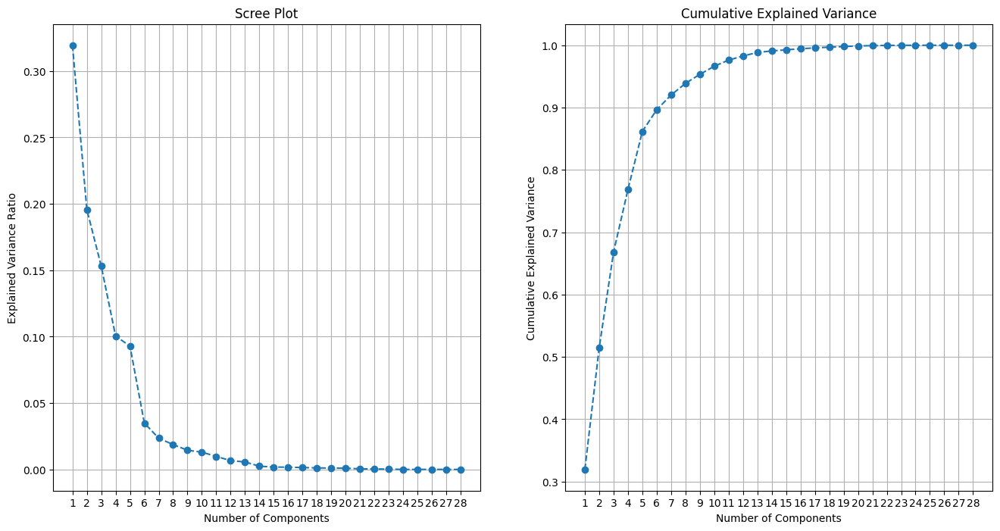

In [ ]:
#PCA Analysis
# Drop class
X = pistachio_df.drop('Class', axis=1)

# Standardize the dataset
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#  Fit PCA without reducing dimensions
pca = PCA()
pca.fit(X_scaled)

# Plot the Scree Plot and
plt.figure(figsize=(16, 8))
plt.subplot(1,2,1)
plt.plot(np.arange(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o', linestyle='--')
plt.title('Scree Plot')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.xticks(np.arange(1, len(pca.explained_variance_ratio_) + 1))
plt.grid(True)

plt.subplot(1,2,2)
plt.plot(np.arange(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.xticks(np.arange(1, len(pca.explained_variance_ratio_) + 1))
plt.grid(True)
plt.show()


## Preprocessing object

In [ ]:
class DataPreprocessor:
    def __init__(self, df=None, file_path=None, target_col='Class'):
        """Initialize with either a dataframe or a file path."""
        # Copy dataset
        if df is not None:
            self.df = df.copy()
        # Try to read dataset from path
        elif file_path is not None:
            try:
                self.df = pd.read_excel(file_path)
            except:
                raise ValueError("Cannot read dataset from specified path.")
        else:
            raise ValueError("Either df or file_path must be provided.")

        self.target_col = target_col
        self.features = self.df.drop(columns=[target_col])
        self.labels = self.df[target_col]
        self.label_encoder = LabelEncoder()

        self.scaler = StandardScaler()
        self.normalizer = MinMaxScaler()
        self.pca = None
        self.lda = None

        self.X_train = None
        self.X_test = None
        self.y_train = None
        self.y_test = None

        self.random_state = 42

        # Processing Flags
        self.standardized = False
        self.normalized = False
        self.splited = False
        self.pca_applied = False
        self.lda_applied = False
        self.encoded = False
        self.smote_applied = False



    def encode_labels(self):
        """Encodes the target column if it is categorical."""
        if self.encoded:
            warnings.warn("Target labels are already encoded.")
            return

        self.labels = self.label_encoder.fit_transform(self.labels)
        if self.splited:
            self.y_train = self.label_encoder.transform(self.y_train)
            self.y_test = self.label_encoder.transform(self.y_test)

        self.encoded = True



    def split_data(self, test_size=0.2):
        """Split data into training and testing sets."""
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(
            self.features, self.labels, test_size=test_size, random_state=self.random_state
        )
        self.splited = True



    def apply_smote(self):
        """Apply SMOTE to balance the training set. Requires splitting and label encoding."""
        if not self.splited:
            raise ValueError("Data must be split before applying SMOTE.")

        if not self.encoded:
            raise ValueError("Target labels must be encoded before applying SMOTE.")

        if self.smote_applied:
            warnings.warn("SMOTE has already been applied.")
            return

        smote = SMOTE(random_state=self.random_state)
        self.X_train, self.y_train = smote.fit_resample(self.X_train, self.y_train)

        self.smote_applied = True




    def normalize_data(self):
        """Normalize data using MinMaxScaler."""
        if self.standardized:
            print("Warning: Data is already standardized. Normalization might not be necessary.")
            return
        if self.normalized:
            print("Warning: Data is already normalized.")
            return

        if self.splited:
            self.X_train = self.normalizer.fit_transform(self.X_train)
            self.X_test = self.normalizer.transform(self.X_test)
            self.features = self.normalizer.fit_transform(self.features)
        else:
            self.features = self.normalizer.fit_transform(self.features)

        self.normalized = True



    def standardize_data(self):
        """Standardize data using StandardScaler."""
        if self.normalized:
            print("Warning: Data is already normalized. Standardization might not be necessary.")
            return
        if self.standardized:
            print("Warning: Data is already standardized.")
            return

        if self.splited:
            self.X_train = self.scaler.fit_transform(self.X_train)
            self.X_test = self.scaler.transform(self.X_test)
            self.features = self.scaler.fit_transform(self.features)
        else:
            self.features = self.scaler.fit_transform(self.features)

        self.standardized = True



    def apply_pca(self, n_components=None):
        """Apply PCA to reduce dimensionality. Requires standardized data."""
        if not self.standardized:
            raise ValueError("Data must be standardized before applying PCA.")
        if self.pca_applied or self.lda_applied:
            print("Warning: Dimensionality reduction has already been applied.")
            return

        if n_components is None:
            n_components = min(self.features.shape[1], self.features.shape[0])

        self.pca = PCA(n_components=n_components)

        if self.splited:
            self.X_train = self.pca.fit_transform(self.X_train)
            self.X_test = self.pca.transform(self.X_test)
        else:
            self.features = self.pca.fit_transform(self.features)

        self.pca_applied = True



    def apply_lda(self, n_components=None):
        """Apply LDA to reduce dimensionality. Requires standardized data."""
        if not self.standardized:
            raise ValueError("Data must be standardized before applying LDA.")
        if self.pca_applied or self.lda_applied:
            print("Warning: Dimensionality reduction has already been applied.")
            return

        if n_components is None:
            n_components = min(len(np.unique(self.labels)) - 1, self.features.shape[1])

        self.lda = LDA(n_components=n_components)

        if self.splited:
            self.X_train = self.lda.fit_transform(self.X_train, self.y_train)
            self.X_test = self.lda.transform(self.X_test)
        else:
            self.features = self.lda.fit_transform(self.features, self.labels)

        self.lda_applied = True



    def get_processed_data(self):
        """Return processed data."""
        if not self.splited:
            return self.features, self.labels
        else:
            return self.X_train, self.X_test, self.y_train, self.y_test

## CNN Preprocessing:

### Using a pretrained model

For the pretrained model we have

In [ ]:
# Load VGG16 model without the classifier
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Extract features before the fully connected layers
feature_extractor = Model(inputs=base_model.input, outputs=Flatten()(base_model.output))

# Extract features from the loaded images
features_VGG = feature_extractor.predict(images)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
68/68 ━━━━━━━━━━━━━━━━━━━━ 1361s 20s/step


In [ ]:
# Save the extracted feature
np.save('/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/features_VGG.npy', features_VGG)

In [ ]:
# Save the labels
np.save('/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/labels.npy', labels)

### Custom Model

#### CNN1

In [ ]:
# Define a custom CNN model
model = models.Sequential()

model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Dropout(0.3))

# Flatten the output for the fully connected layers
model.add(layers.Flatten())

model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.4))

# Output Layer
model.add(layers.Dense(2, activation='softmax'))

# Print model summary
model.summary()

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model
model.fit(images, labels, epochs=10, batch_size=32, validation_split = 0.2)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             258 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,218 (42.61 MB)

 Trainable params: 11,169,218 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 202s 4s/step - accuracy: 0.7085 - loss: 0.7102 - val_accuracy: 0.8442 - val_loss: 0.3804
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.8291 - loss: 0.3839 - val_accuracy: 0.8419 - val_loss: 0.3550
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 215s 4s/step - accuracy: 0.8543 - loss: 0.3165 - val_accuracy: 0.8349 - val_loss: 0.3459
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 197s 4s/step - accuracy: 0.8708 - loss: 0.3152 - val_accuracy: 0.8605 - val_loss: 0.3281
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 194s 4s/step - accuracy: 0.8608 - loss: 0.2925 - val_accuracy: 0.8279 - val_loss: 0.3405
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 207s 4s/step - accuracy: 0.8728 - loss: 0.2646 - val_accuracy: 0.8419 - val_loss: 0.3533
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 198s 4s/step - accuracy: 0.8877 - loss: 0.2461 - val_accuracy: 0.8558 - val_loss: 0.3467
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 194s 4s/step - accuracy: 0.9108 - loss: 0.2039 - val_accuracy: 0.8488 - v

In [ ]:
# Save CNN
model.save('/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/cnn_model_10epoch.h5')

In [ ]:
# Continue training
model.fit(images, labels, epochs=3, batch_size=32, validation_split = 0.2 )

Epoch 1/3
54/54 ━━━━━━━━━━━━━━━━━━━━ 195s 4s/step - accuracy: 0.9503 - loss: 0.1390 - val_accuracy: 0.8326 - val_loss: 0.4706
Epoch 2/3
54/54 ━━━━━━━━━━━━━━━━━━━━ 199s 4s/step - accuracy: 0.9508 - loss: 0.1149 - val_accuracy: 0.8814 - val_loss: 0.3519
Epoch 3/3
54/54 ━━━━━━━━━━━━━━━━━━━━ 210s 4s/step - accuracy: 0.9664 - loss: 0.0927 - val_accuracy: 0.8953 - val_loss: 0.3824


#### CNN2


In [ ]:
# Define a custom CNN model
model2 = models.Sequential()

model2.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model2.add(layers.MaxPooling2D((2, 2)))

model2.add(layers.Conv2D(32, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))

model2.add(layers.Conv2D(64, (3, 3), activation='relu'))
model2.add(layers.MaxPooling2D((2, 2)))

model2.add(layers.Dropout(0.3))

# Flatten the output for the fully connected layers
model2.add(layers.Flatten())

model2.add(layers.Dense(64, activation='relu'))
model2.add(layers.Dropout(0.3))

# Output Layer
model2.add(layers.Dense(2, activation='softmax'))

# Print model summary
model2.summary()

# Compile the model
model2.compile(optimizer='sgd', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model
model2.fit(images, labels, epochs=15, batch_size=32, validation_split = 0.2)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 43264)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │       2,768,960 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 2)                   │             130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,792,674 (10.65 MB)

 Trainable params: 2,792,674 (10.65 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - accuracy: 0.6444 - loss: 0.6407 - val_accuracy: 0.6465 - val_loss: 0.6212
Epoch 2/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step - accuracy: 0.7502 - loss: 0.5050 - val_accuracy: 0.8140 - val_loss: 0.4262
Epoch 3/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 136s 1s/step - accuracy: 0.8093 - loss: 0.4308 - val_accuracy: 0.7186 - val_loss: 0.5860
Epoch 4/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - accuracy: 0.8024 - loss: 0.4109 - val_accuracy: 0.8163 - val_loss: 0.3817
Epoch 5/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - accuracy: 0.8012 - loss: 0.4249 - val_accuracy: 0.7744 - val_loss: 0.4507
Epoch 6/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 141s 2s/step - accuracy: 0.8034 - loss: 0.4080 - val_accuracy: 0.8070 - val_loss: 0.4170
Epoch 7/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.8335 - loss: 0.3856 - val_accuracy: 0.8070 - val_loss: 0.3895
Epoch 8/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - accuracy: 0.8141 - loss: 0.3953 - val_accuracy: 0.8326 - val_

#### CNN3

In [ ]:
# Define a custom CNN model
model3 = models.Sequential()

model3.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model3.add(layers.MaxPooling2D((2, 2)))

model3.add(layers.Conv2D(32, (3, 3), activation='relu'))
model3.add(layers.MaxPooling2D((2, 2)))

model3.add(layers.Dropout(0.2))

model3.add(layers.Conv2D(64, (3, 3), activation='relu'))
model3.add(layers.MaxPooling2D((2, 2)))

model3.add(layers.Dropout(0.2))

model3.add(layers.Conv2D(64, (3, 3), activation='relu'))
model3.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for the fully connected layers
model3.add(layers.Flatten())

model3.add(layers.Dense(64, activation='relu'))
model3.add(layers.Dropout(0.3))

# Output Layer
model3.add(layers.Dense(2, activation='softmax'))

# Print model summary
model3.summary()

# Compile the model
model3.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Fit the model
model3.fit(images, labels, epochs=15, batch_size=32, validation_split = 0.2)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 109, 109, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 52, 52, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 24, 24, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 12, 12, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │         589,888 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 2)                   │             130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 655,586 (2.50 MB)

 Trainable params: 655,586 (2.50 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 136s 2s/step - accuracy: 0.6602 - loss: 0.6097 - val_accuracy: 0.8372 - val_loss: 0.3958
Epoch 2/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - accuracy: 0.8182 - loss: 0.4090 - val_accuracy: 0.8326 - val_loss: 0.3696
Epoch 3/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - accuracy: 0.8399 - loss: 0.3584 - val_accuracy: 0.8488 - val_loss: 0.3544
Epoch 4/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.8505 - loss: 0.3474 - val_accuracy: 0.8535 - val_loss: 0.3329
Epoch 5/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - accuracy: 0.8579 - loss: 0.3252 - val_accuracy: 0.8860 - val_loss: 0.3030
Epoch 6/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 126s 2s/step - accuracy: 0.8985 - loss: 0.2617 - val_accuracy: 0.8837 - val_loss: 0.2937
Epoch 7/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 140s 2s/step - accuracy: 0.8947 - loss: 0.2548 - val_accuracy: 0.9023 - val_loss: 0.2584
Epoch 8/15
54/54 ━━━━━━━━━━━━━━━━━━━━ 143s 2s/step - accuracy: 0.9223 - loss: 0.2155 - val_accuracy: 0.8953 - v

In [ ]:
# Save model
model3.save('/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/cnn_model_3epoch15.h5')

In [ ]:
# Countinue training for 5 more epochs
model3.fit(images, labels, epochs=5, batch_size=32, validation_split = 0.2)

Epoch 1/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step - accuracy: 0.9601 - loss: 0.1067 - val_accuracy: 0.9209 - val_loss: 0.2678
Epoch 2/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 141s 2s/step - accuracy: 0.9578 - loss: 0.0965 - val_accuracy: 0.9256 - val_loss: 0.2158
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 139s 2s/step - accuracy: 0.9603 - loss: 0.1132 - val_accuracy: 0.9256 - val_loss: 0.2284
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.9685 - loss: 0.0884 - val_accuracy: 0.9279 - val_loss: 0.2205
Epoch 5/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.9815 - loss: 0.0565 - val_accuracy: 0.9372 - val_loss: 0.2528


#### Feature Extractor

##### CNN1

In [ ]:
# Define a new model that outputs the feature activations from the third Conv layer
inputs  = model.inputs
outputs = model.layers[6].output
feature_extractor = Model(inputs = inputs, outputs = outputs )  # Index 6 is the third Conv Layer

# Use the feature extractor to get the feature maps
features_custom = feature_extractor.predict(images)


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(32, 224, 224, 3))
  warnings.warn(msg)


68/68 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 224, 224, 3))
  warnings.warn(msg)


In [ ]:
# Save features
np.save('/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/features_custom.npy', features_custom)

##### CNN3

In [ ]:
# Load the model
model = load_model('/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/cnn_model_3epoch15.h5')

In [ ]:
# Set model input as 1
model.layers[0].input_shape = (1, 224, 224, 3)

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 109, 109, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 54, 54, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 52, 52, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 24, 24, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 12, 12, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │         589,888 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 2)                   │             130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 655,588 (2.50 MB)

 Trainable params: 655,586 (2.50 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [ ]:
# Define a new model with the output of the feature extractor
inputs  = model.inputs
outputs = model.layers[10].output
feature_extractor = Model(inputs = inputs, outputs = outputs )  # Index 6 is the third Conv Layer

# Use the feature extractor to get the feature maps
features_custom2 = feature_extractor.predict(images)


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(32, 224, 224, 3))
  warnings.warn(msg)


68/68 ━━━━━━━━━━━━━━━━━━━━ 41s 593ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_1']
Received: inputs=Tensor(shape=(None, 224, 224, 3))
  warnings.warn(msg)


In [ ]:
features_custom2.shape

(2148, 9216)

In [ ]:
# Save The features
np.save('/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/features_custom2.npy', features_custom2)

### Image Plotting

In [ ]:
def plot_images_before_after_conv(images, labels, model, class_names):
    """
    Plots the first 5 images from each class before and after convolution operations.

    Args:
        images (tf.Tensor): Tensor of images.
        labels (tf.Tensor): Corresponding labels.
        model (tf.keras.Model): CNN model for feature extraction.
        class_names (list): List of class names corresponding to label indices.
    """
    unique_classes = np.unique(labels.numpy())
    fig, axes = plt.subplots(len(unique_classes), 10, figsize=(20, 2 * len(unique_classes)))

    for i, cls in enumerate(unique_classes):
        # Get first 5 images from this class
        idxs = np.where(labels.numpy() == cls)[0][:5]
        original_imgs = images.numpy()[idxs]

        # Get feature maps after conv layer
        layer_outputs = model.layers[3].output
        feature_extractor = tf.keras.Model(inputs=model.input, outputs=layer_outputs)
        conv_imgs = feature_extractor.predict(original_imgs)

        # Plot original and convolved images
        for j in range(5):
            # Original image
            axes[i, j].imshow(original_imgs[j])
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(f"Class: {class_names[cls]}")

            # Convolved image
            conv_img = conv_imgs[j, :, :, 0]
            axes[i, j + 5].imshow(conv_img, cmap='gray')
            axes[i, j + 5].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Class names
class_names = ['Kirmizi', 'Siirt']
plot_images_before_after_conv(images, labels, model, class_names)

# Modeling

## Classification

###Classification object

In [ ]:
class ClassifierEvaluator:
    def __init__(self, X_train, X_test, y_train, y_test):
        from sklearn.naive_bayes import GaussianNB
        from sklearn.svm import SVC
        from sklearn.neural_network import MLPClassifier
        from sklearn.ensemble import StackingClassifier
        from sklearn.linear_model import LogisticRegression
        from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

        # Dataset
        self.X_train = X_train
        self.X_test = X_test
        self.y_train = y_train
        self.y_test = y_test

        # Default parameters
        self.nb_params = {}
        self.svm_params = {"kernel": "rbf", "C": 1.0}
        self.mlp_params = {"hidden_layer_sizes": (100,), "max_iter": 200}
        self.stack_params = {}

        # Initialize classifiers
        self.nb_model = GaussianNB(**self.nb_params)
        self.svm_model = SVC(probability=True, **self.svm_params)
        self.mlp_model = MLPClassifier(**self.mlp_params)

        # Stacking model with Naïve Bayes, SVM, and MLP as base learners
        self.stack_model = StackingClassifier(
            estimators=[("nb", self.nb_model), ("svm", self.svm_model), ("mlp", self.mlp_model)],
            final_estimator=LogisticRegression(**self.stack_params),
        )

    def evaluate_model(self, y_pred):
        """Evaluate classification performance and return accuracy, precision, recall, and F1-score."""
        accuracy = accuracy_score(self.y_test, y_pred)
        precision = precision_score(self.y_test, y_pred, average='weighted')
        recall = recall_score(self.y_test, y_pred, average='weighted')
        f1 = f1_score(self.y_test, y_pred, average='weighted')

        return {
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1-score": f1
        }

    def train_nb(self, nb_params=None, ret_predict=False):
        if nb_params:
            self.nb_params = nb_params

        self.nb_model = GaussianNB(**self.nb_params)
        self.nb_model.fit(self.X_train, self.y_train)
        y_pred = self.nb_model.predict(self.X_test)

        return y_pred if ret_predict else self.evaluate_model(y_pred)

    def train_svm(self, svm_params=None, ret_predict=False):
        if svm_params:
            self.svm_params = svm_params

        self.svm_model = SVC(probability=True, **self.svm_params)
        self.svm_model.fit(self.X_train, self.y_train)
        y_pred = self.svm_model.predict(self.X_test)

        return y_pred if ret_predict else self.evaluate_model(y_pred)

    def train_mlp(self, mlp_params=None, ret_predict=False):
        if mlp_params:
            self.mlp_params = mlp_params

        self.mlp_model = MLPClassifier(**self.mlp_params)
        self.mlp_model.fit(self.X_train, self.y_train)
        y_pred = self.mlp_model.predict(self.X_test)

        return y_pred if ret_predict else self.evaluate_model(y_pred)

    def train_stack(self, stack_params=None, ret_predict=False):
        if stack_params:
            self.stack_params = stack_params

        self.stack_model = StackingClassifier(
            estimators=[("nb", self.nb_model), ("svm", self.svm_model), ("mlp", self.mlp_model)],
            final_estimator=LogisticRegression(**self.stack_params),
        )
        self.stack_model.fit(self.X_train, self.y_train)
        y_pred = self.stack_model.predict(self.X_test)

        return y_pred if ret_predict else self.evaluate_model(y_pred)

### Load the dataset




In [ ]:
# Set paths
full_dataset_dir =  "/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/Pistachio_28_Features_Dataset/Pistachio_28_Features_Dataset.xlsx"
selected_features_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/pistachio_df_cleaned.xlsx'
custom_cnn_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/features_custom2.npy'
vgg_features_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/features_VGG.npy'
labels_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/labels.npy'


In [ ]:
# Load the datasets
full_dataset = pd.read_excel(full_dataset_dir)
selected_features = pd.read_excel(selected_features_dir)
custom_cnn = np.load(custom_cnn_dir)
vgg_features = np.load(vgg_features_dir)
labels = np.load(labels_dir)

In [ ]:
# Preprocess feature data
# Full dataset
preprocessor_full_dataset = DataPreprocessor(full_dataset)
preprocessor_full_dataset.encode_labels()
preprocessor_full_dataset.split_data()
preprocessor_full_dataset.apply_smote()
preprocessor_full_dataset.standardize_data()
x_train_full, x_test_full, y_train_full, y_test_full = preprocessor_full_dataset.get_processed_data()
# PCA
preprocessor_full_dataset.apply_pca()
x_train_pca, x_test_pca, y_train_pca, y_test_pca = preprocessor_full_dataset.get_processed_data()
# Selected features
preprocessor_selected_features = DataPreprocessor(selected_features)
preprocessor_selected_features.encode_labels()
preprocessor_selected_features.split_data()
preprocessor_selected_features.apply_smote()
preprocessor_selected_features.standardize_data()
x_train_selected, x_test_selected, y_train_selected, y_test_selected = preprocessor_selected_features.get_processed_data()
# LDA
preprocessor_selected_features.apply_lda()
x_train_lda, x_test_lda, y_train_lda, y_test_lda = preprocessor_selected_features.get_processed_data()


In [ ]:
# Split image features
x_train_cnn, x_test_cnn, y_train_cnn, y_test_cnn = train_test_split(custom_cnn, labels, test_size=0.2, random_state=42)
x_train_vgg, x_test_vgg, y_train_vgg, y_test_vgg = train_test_split(vgg_features, labels, test_size=0.2, random_state=42)

### Prameter Tuning

In [ ]:
#SVM with Grid Search
svm_pipeline = Pipeline([('clf', SVC())])
svm_params = {
    'clf__C': [0.1, 1, 5, 10, 15],
    'clf__kernel': ['linear', 'rbf'],
    'clf__gamma': ['scale', 'auto']
}
svm_grid = GridSearchCV(svm_pipeline, svm_params, cv=5, scoring='f1_weighted')
svm_grid.fit(x_train_selected, y_train_selected)
print("Best SVM Parameters:", svm_grid.best_params_)
svm_para = svm_grid.best_params_
y_pred_svm = svm_grid.predict(x_test_selected)
print("SVM Classification Report:\n", classification_report(y_test_selected, y_pred_svm))

Best SVM Parameters: {'clf__C': 10, 'clf__gamma': 'scale', 'clf__kernel': 'rbf'}
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95       244
           1       0.91      0.96      0.93       186

    accuracy                           0.94       430
   macro avg       0.94      0.94      0.94       430
weighted avg       0.94      0.94      0.94       430



In [ ]:
#MLP with GridSearch
mlp_params = {
    'hidden_layer_sizes': [ (128,), (64, 64), (32,64,128)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001],
    'max_iter': [300, 500]
}
mlp_grid = GridSearchCV(MLPClassifier(), mlp_params, cv=5, scoring='f1_weighted')
mlp_grid.fit(x_train_selected, y_train_selected )
y_pred_mlp = mlp_grid.predict(x_test_selected )
print("Best MLP Params:", mlp_grid.best_params_)
print("MLP Classification Report:\n", classification_report(y_test_selected, y_pred_mlp))

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptro

Best MLP Params: {'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (128,), 'max_iter': 500, 'solver': 'adam'}
MLP Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.93      0.93       244
           1       0.91      0.91      0.91       186

    accuracy                           0.92       430
   macro avg       0.92      0.92      0.92       430
weighted avg       0.92      0.92      0.92       430



/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
# Further MLP tuning
temp = ClassifierEvaluator(x_train_selected, x_test_selected, y_train_selected, y_test_selected)
temp.train_mlp({'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (100,100), 'max_iter': 30, 'solver': 'adam'})


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


{'Accuracy': 0.9325581395348838,
 'Precision': 0.9330092561695484,
 'Recall': 0.9325581395348838,
 'F1-score': 0.9326562887735791}

In [ ]:
# Best models from previous tuning
best_nb = GaussianNB()
best_svm = SVC(C= 10, gamma= 'scale', kernel= 'rbf', probability=True)
best_mlp = MLPClassifier(activation = 'tanh', alpha = 0.001, hidden_layer_sizes= (100,100), max_iter= 30, solver= 'adam')

# Stacking classifier with tuned base models
stack_model = StackingClassifier(
    estimators=[('nb', best_nb), ('svm', best_svm), ('mlp', best_mlp)],
    final_estimator=LogisticRegression()
)

param_grid = {
    "final_estimator__C": [0.01, 0.1, 1, 10, 100],  # Regularization strength
    "final_estimator__penalty": ["l1", "l2"],  # Regularization type
    "final_estimator__solver": ["liblinear", "saga"]  # Solvers for L1 & L2 penalties
}

grid_search_stack = GridSearchCV(
    stack_model,
    param_grid,
    cv=3,
    scoring="accuracy",
    verbose=2,
    n_jobs=-1
)

grid_search_stack.fit(x_train_selected, y_train_selected)
print("Best Parameters for Stacking Classifier:", grid_search_stack.best_params_)
print("Best Score for Stacking Classifier:", grid_search_stack.best_score_)


Fitting 3 folds for each of 20 candidates, totalling 60 fits


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py

Best Parameters for Stacking Classifier: {'final_estimator__C': 100, 'final_estimator__penalty': 'l1', 'final_estimator__solver': 'liblinear'}
Best Score for Stacking Classifier: 0.9337180001629685


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


### Train models

In [ ]:
# Datasets dictionary
datasets = {
    "full_dataset": (x_train_full, x_test_full, y_train_full, y_test_full),
    "selected_features": (x_train_selected, x_test_selected, y_train_selected, y_test_selected),
    "pca": (x_train_pca, x_test_pca, y_train_pca, y_test_pca),
    "lda": (x_train_lda, x_test_lda, y_train_lda, y_test_lda),
    "cnn": (x_train_cnn, x_test_cnn, y_train_cnn, y_test_cnn),
    "vgg": (x_train_vgg, x_test_vgg, y_train_vgg, y_test_vgg)
}



# Params
params = {'SVM': {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'} ,
          'MLP':{'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (100,100), 'max_iter': 30, 'solver': 'adam'},
          'Stacking': {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}
          }

In [ ]:
# Train Models
classification_results = {}

warnings.simplefilter("ignore", ConvergenceWarning)

for dataset_name, (X_train, X_test, y_train, y_test) in datasets.items():

    print(f"\nDataset: {dataset_name}")
    evaluator = ClassifierEvaluator(X_train, X_test, y_train, y_test)
    classification_results[dataset_name] = {}

    # Train nb
    classification_results[dataset_name]['Naive Bayes'] = evaluator.train_nb()

    # Train SVM
    classification_results[dataset_name]['SVM'] = evaluator.train_svm(params['SVM'])

    # Train MLP
    classification_results[dataset_name]['MLP'] = evaluator.train_mlp(params['MLP'])

    # Train Stacking Classifier
    classification_results[dataset_name]['Stacking'] = evaluator.train_stack(params['Stacking'])

    print(f"Results for {dataset_name}: {classification_results[dataset_name]}")




Dataset: full_dataset
Results for full_dataset: {'Naive Bayes': {'Accuracy': 0.8813953488372093, 'Precision': 0.8874761785122502, 'Recall': 0.8813953488372093, 'F1-score': 0.8819151623348875}, 'SVM': {'Accuracy': 0.9511627906976744, 'Precision': 0.9513452162685011, 'Recall': 0.9511627906976744, 'F1-score': 0.9512070966195157}, 'MLP': {'Accuracy': 0.9465116279069767, 'Precision': 0.9472273361184791, 'Recall': 0.9465116279069767, 'F1-score': 0.9466163753210449}, 'Stacking': {'Accuracy': 0.9558139534883721, 'Precision': 0.9558521834855626, 'Recall': 0.9558139534883721, 'F1-score': 0.9558278185628896}}

Dataset: selected_features
Results for selected_features: {'Naive Bayes': {'Accuracy': 0.8860465116279069, 'Precision': 0.8884003223608224, 'Recall': 0.8860465116279069, 'F1-score': 0.8864110381662401}, 'SVM': {'Accuracy': 0.9395348837209302, 'Precision': 0.9408755511745545, 'Recall': 0.9395348837209302, 'F1-score': 0.9396938316486722}, 'MLP': {'Accuracy': 0.9348837209302325, 'Precision': 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Results for cnn: {'Naive Bayes': {'Accuracy': 0.4325581395348837, 'Precision': 0.457664187721744, 'Recall': 0.4325581395348837, 'F1-score': 0.3860475706117168}, 'SVM': {'Accuracy': 0.5186046511627908, 'Precision': 0.5084083861625136, 'Recall': 0.5186046511627908, 'F1-score': 0.5101316316993069}, 'MLP': {'Accuracy': 0.5209302325581395, 'Precision': 0.5203620577275466, 'Recall': 0.5209302325581395, 'F1-score': 0.5206350376133019}, 'Stacking': {'Accuracy': 0.5627906976744186, 'Precision': 0.3167333693888589, 'Recall': 0.5627906976744186, 'F1-score': 0.40534330011074193}}

Dataset: vgg


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Results for vgg: {'Naive Bayes': {'Accuracy': 0.5348837209302325, 'Precision': 0.5612598385083676, 'Recall': 0.5348837209302325, 'F1-score': 0.5306667635154494}, 'SVM': {'Accuracy': 0.5465116279069767, 'Precision': 0.5019734045782986, 'Recall': 0.5465116279069767, 'F1-score': 0.4616186046511627}, 'MLP': {'Accuracy': 0.5627906976744186, 'Precision': 0.3167333693888589, 'Recall': 0.5627906976744186, 'F1-score': 0.40534330011074193}, 'Stacking': {'Accuracy': 0.5627906976744186, 'Precision': 0.3167333693888589, 'Recall': 0.5627906976744186, 'F1-score': 0.40534330011074193}}


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# Save classification results
classification_report_df = pd.DataFrame(classification_results)
classification_report_df.to_excel('/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/classification_results.xlsx')

In [ ]:
classification_report_df

,full_dataset,selected_features,pca,lda,cnn,vgg
Naive Bayes,"{'Accuracy': 0.8813953488372093, 'Precision': ...","{'Accuracy': 0.8860465116279069, 'Precision': ...","{'Accuracy': 0.8093023255813954, 'Precision': ...","{'Accuracy': 0.9232558139534883, 'Precision': ...","{'Accuracy': 0.4325581395348837, 'Precision': ...","{'Accuracy': 0.5348837209302325, 'Precision': ..."
SVM,"{'Accuracy': 0.9511627906976744, 'Precision': ...","{'Accuracy': 0.9395348837209302, 'Precision': ...","{'Accuracy': 0.9511627906976744, 'Precision': ...","{'Accuracy': 0.9255813953488372, 'Precision': ...","{'Accuracy': 0.5186046511627908, 'Precision': ...","{'Accuracy': 0.5465116279069767, 'Precision': ..."
MLP,"{'Accuracy': 0.9465116279069767, 'Precision': ...","{'Accuracy': 0.9348837209302325, 'Precision': ...","{'Accuracy': 0.9279069767441861, 'Precision': ...","{'Accuracy': 0.9255813953488372, 'Precision': ...","{'Accuracy': 0.5209302325581395, 'Precision': ...","{'Accuracy': 0.5627906976744186, 'Precision': ..."
Stacking,"{'Accuracy': 0.9558139534883721, 'Precision': ...","{'Accuracy': 0.9441860465116279, 'Precision': ...","{'Accuracy': 0.9511627906976744, 'Precision': ...","{'Accuracy': 0.9255813953488372, 'Precision': ...","{'Accuracy': 0.5627906976744186, 'Precision': ...","{'Accuracy': 0.5627906976744186, 'Precision': ..."


## Outlier Detection Object

In [ ]:
class OutlierDetector:
    def __init__(self, X):
        """Initialize with dataset X (no labels needed)."""
        self.X = X

        # Default parameters
        self.lof_params = {"n_neighbors": 20, "contamination": 0.1}
        self.isf_params = {"n_estimators": 100, "contamination": 0.1}
        self.ocsvm_params = {"kernel": "rbf", "nu": 0.1}

        # Initialize models
        self.lof = LocalOutlierFactor(**self.lof_params)
        self.isf = IsolationForest(**self.isf_params)
        self.ocsvm = OneClassSVM(**self.ocsvm_params)

    def detect_lof(self, lof_params=None):
        """Detect outliers using LOF and return outlier indices."""
        if lof_params:
            self.lof_params = lof_params

        self.lof = LocalOutlierFactor(**self.lof_params)
        outlier_mask = self.lof.fit_predict(self.X)  # -1 indicates an outlier
        return np.where(outlier_mask == -1)[0]

    def detect_isf(self, isf_params=None):
        """Detect outliers using Isolation Forest and return outlier indices."""
        if isf_params:
            self.isf_params = isf_params

        self.isf = IsolationForest(**self.isf_params)
        outlier_mask = self.isf.fit_predict(self.X)
        return np.where(outlier_mask == -1)[0]

    def detect_ocsvm(self, ocsvm_params=None):
        """Detect outliers using One-Class SVM and return outlier indices."""
        if ocsvm_params:
            self.ocsvm_params = ocsvm_params

        self.ocsvm = OneClassSVM(**self.ocsvm_params)
        outlier_mask = self.ocsvm.fit_predict(self.X)
        return np.where(outlier_mask == -1)[0]

### Load and prepare' the dataset




In [ ]:
# Set paths
full_dataset_dir =  "/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/Pistachio_28_Features_Dataset/Pistachio_28_Features_Dataset.xlsx"
selected_features_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/pistachio_df_cleaned.xlsx'
custom_cnn_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/features_custom2.npy'
vgg_features_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/features_VGG.npy'
labels_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/labels.npy'


In [ ]:
# Load the datasets
full_dataset = pd.read_excel(full_dataset_dir)
selected_features = pd.read_excel(selected_features_dir)
custom_cnn = np.load(custom_cnn_dir)
vgg_features = np.load(vgg_features_dir)
labels = np.load(labels_dir)

In [ ]:
# Preprocess feature data
# Full dataset
preprocessor_full_dataset = DataPreprocessor(full_dataset)
preprocessor_full_dataset.standardize_data()
x_full,_ = preprocessor_full_dataset.get_processed_data()
# PCA
preprocessor_full_dataset.apply_pca()
x_pca, _ = preprocessor_full_dataset.get_processed_data()
# Selected features
preprocessor_selected_features = DataPreprocessor(selected_features)
preprocessor_selected_features.standardize_data()
x_selected, y = preprocessor_selected_features.get_processed_data()
# LDA
preprocessor_selected_features.apply_lda()
x_lda, _ = preprocessor_selected_features.get_processed_data()


### Training



In [ ]:
# Define datasets
datasets = {
    "full": x_full,
    "selected": x_selected,
    "pca": x_pca,
    "lda": x_lda,
    "cnn": custom_cnn,
    "vgg": vgg_features
}

# Define parameter sets
lof_params_list = [{"n_neighbors": n, "contamination": 0.1} for n in [ 20, 30, 40, 50]]
isf_params_list = [{"n_estimators": n, "contamination": 0.1} for n in [30, 40, 50, 60]]
ocsvm_params_list = [
    {"kernel": k, "nu": n} for k in ['rbf'] for n in [0.05]
]


In [ ]:
# Dictionary to store final outliers for each dataset and model
final_outliers = {}

# Loop over all datasets
for dataset_name, X in datasets.items():
    print(f"\nProcessing dataset: {dataset_name}")
    detector = OutlierDetector(X)
    final_outliers[dataset_name] = {}

    # LOF outliers (intersection of all parameter sets)
    lof_outliers_sets = [set(detector.detect_lof(params)) for params in lof_params_list]
    final_outliers[dataset_name]["LOF"] = set.intersection(*lof_outliers_sets) if lof_outliers_sets else set()

    # ISF outliers (intersection of all parameter sets)
    isf_outliers_sets = [set(detector.detect_isf(params)) for params in isf_params_list]
    final_outliers[dataset_name]["ISF"] = set.intersection(*isf_outliers_sets) if isf_outliers_sets else set()

    # OCSVM outliers (intersection of all parameter sets)
    ocsvm_outliers_sets = [set(detector.detect_ocsvm(params)) for params in ocsvm_params_list]
    final_outliers[dataset_name]["OCSVM"] = set.intersection(*ocsvm_outliers_sets) if ocsvm_outliers_sets else set()

print("\nOutlier detection completed.")


Processing dataset: full

Processing dataset: selected

Processing dataset: pca

Processing dataset: lda

Processing dataset: cnn

Processing dataset: vgg

Outlier detection completed.


In [ ]:
# Dictionary to store final intersection of outliers for each dataset
final_intersection_outliers = {}

for dataset_name, models_outliers in final_outliers.items():
    print(f"Computing final outliers for dataset: {dataset_name}")

    # Take the intersection of LOF, ISF, and OCSVM outliers
    final_intersection_outliers[dataset_name] = set.intersection(
        models_outliers["LOF"], models_outliers["ISF"], models_outliers["OCSVM"]
    )

print("Final intersection of outliers computed.")

Computing final outliers for dataset: full
Computing final outliers for dataset: selected
Computing final outliers for dataset: pca
Computing final outliers for dataset: lda
Computing final outliers for dataset: cnn
Computing final outliers for dataset: vgg
Final intersection of outliers computed.


In [ ]:
final_intersection_outliers['cnn']

{np.int64(366),
 np.int64(378),
 np.int64(454),
 np.int64(1164),
 np.int64(1165),
 np.int64(1288),
 np.int64(1542),
 np.int64(1640),
 np.int64(1728),
 np.int64(1965),
 np.int64(2013)}

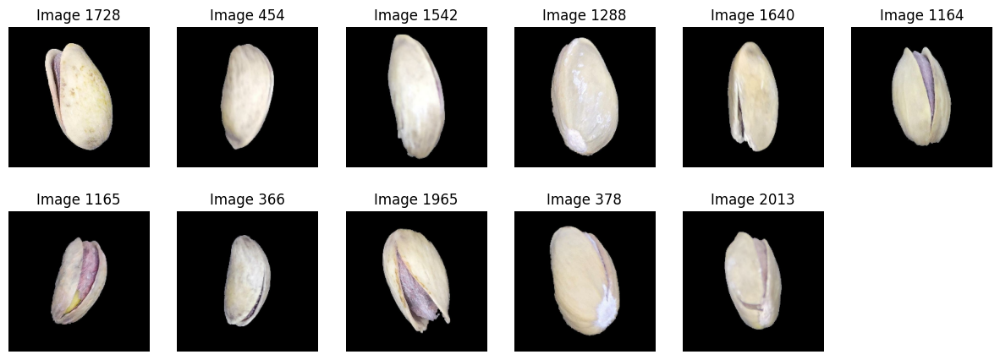

In [ ]:
# Define rows and columns
rows, cols = 2, 6
num_images = len(final_intersection_outliers['cnn'])
fig, axes = plt.subplots(rows, cols, figsize=(15, 5))

# Remove grid
plt.subplots_adjust(wspace=0.2, hspace=0.3)

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot images
for idx, i in enumerate(final_intersection_outliers['cnn']):
    axes[idx].imshow(images[i])
    axes[idx].set_title(f"Image {i}")
    axes[idx].axis('off')  # Hide axes

# Hide unused subplots
for idx in range(num_images, rows * cols):
    fig.delaxes(axes[idx])

plt.show()


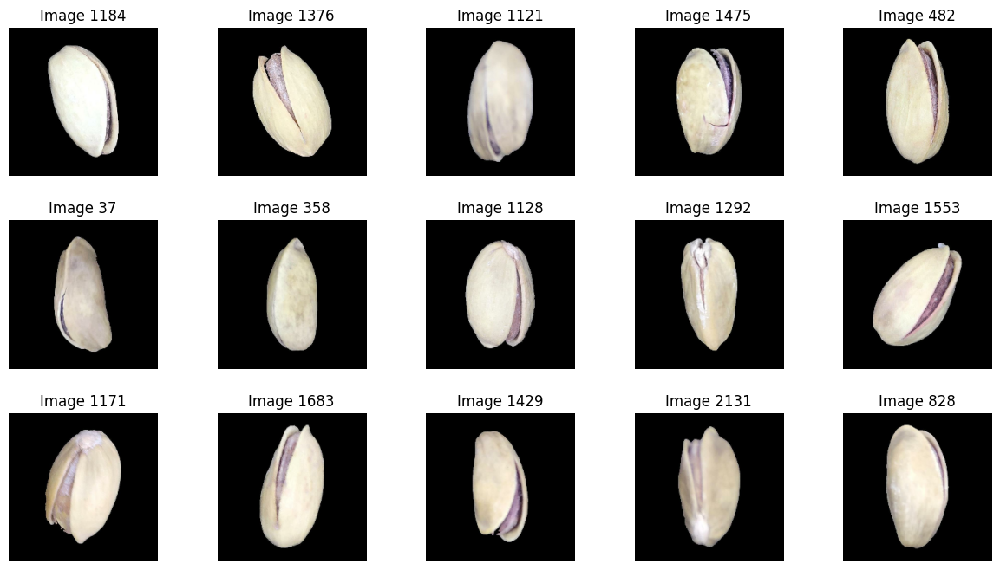

In [ ]:
# Define rows and columns
rows, cols = 3, 5
num_images = len(final_intersection_outliers['vgg'])
fig, axes = plt.subplots(rows, cols, figsize=(15, 8))

# Remove grid
plt.subplots_adjust(wspace=0.2, hspace=0.3)

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot images
for idx, i in enumerate(final_intersection_outliers['vgg']):
    axes[idx].imshow(images[i])
    axes[idx].set_title(f"Image {i}")
    axes[idx].axis('off')  # Hide axes

# Hide unused subplots
for idx in range(num_images, rows * cols):
    fig.delaxes(axes[idx])

plt.show()

In [ ]:
len(final_intersection_outliers['vgg'])

15

In [ ]:
# from collections import Counter

# # Flatten all outlier indices across datasets into a single list
# all_outliers = [int(idx) for indices in final_intersection_outliers.values() for idx in indices]

# # Count occurrences of each outlier
# outlier_counts = Counter(all_outliers)

# # Convert to a list of tuples (outlier_index, count)
# outlier_list = sorted(outlier_counts.items(), key=lambda x: x[1], reverse=True)

# print(outlier_list)

In [ ]:
# Applying LDA for 1D visualization
lda = LDA(n_components=1)
X_lda = lda.fit_transform(x_selected, y)

# Function to plot 1D outliers
def plot_outliers_1d(outliers_dict):
    # Retrieve the outliers for each method
    lof_outliers = list(outliers_dict["LOF"])
    isf_outliers = list(outliers_dict["ISF"])
    ocsvm_outliers = list(outliers_dict["OCSVM"])

    plt.figure(figsize=(12, 5))
    plt.title(f"1D LDA Projection with Outliers for {dataset_name} Dataset", fontsize=14)

    # Plot all points as inliers (default color)
    plt.scatter(range(len(X_lda)), X_lda, label='Inliers', alpha=0.6, color='blue')

    # Highlight outliers from each method
    plt.scatter(lof_outliers, X_lda[lof_outliers], label="LOF Outliers", color="red", marker="x", s=80)
    plt.scatter(isf_outliers, X_lda[isf_outliers], label="ISF Outliers", color="green", marker="x", s=80)
    plt.scatter(ocsvm_outliers, X_lda[ocsvm_outliers], label="OCSVM Outliers", color="orange", marker="x", s=80)

    plt.xlabel("Data Point Index")
    plt.ylabel("LDA Component 1")
    plt.legend()
    plt.grid(True)
    plt.show()

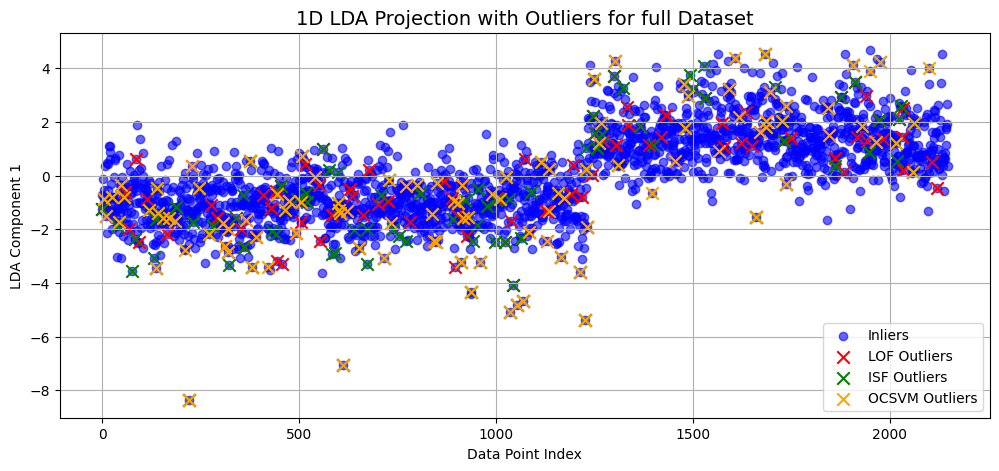

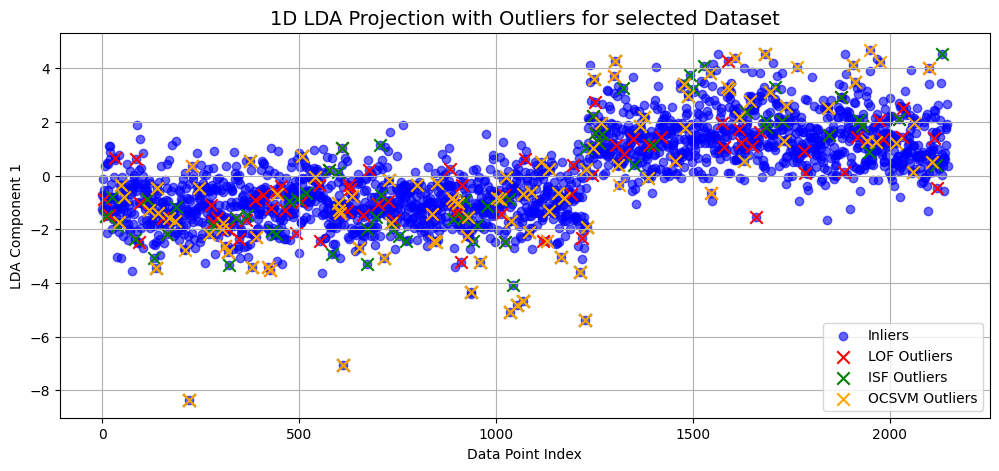

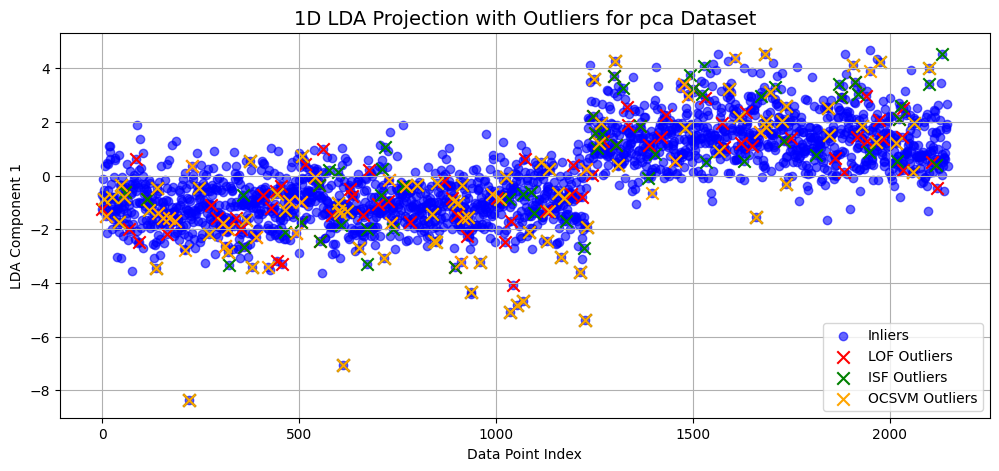

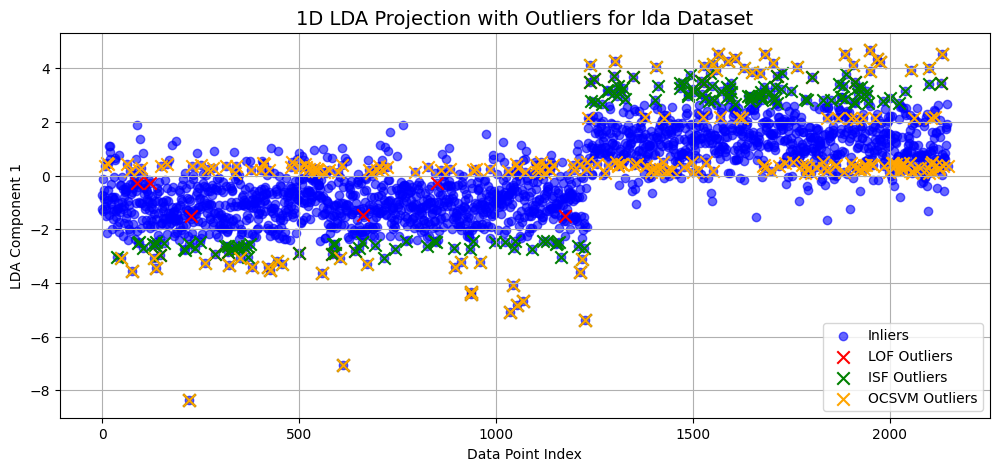

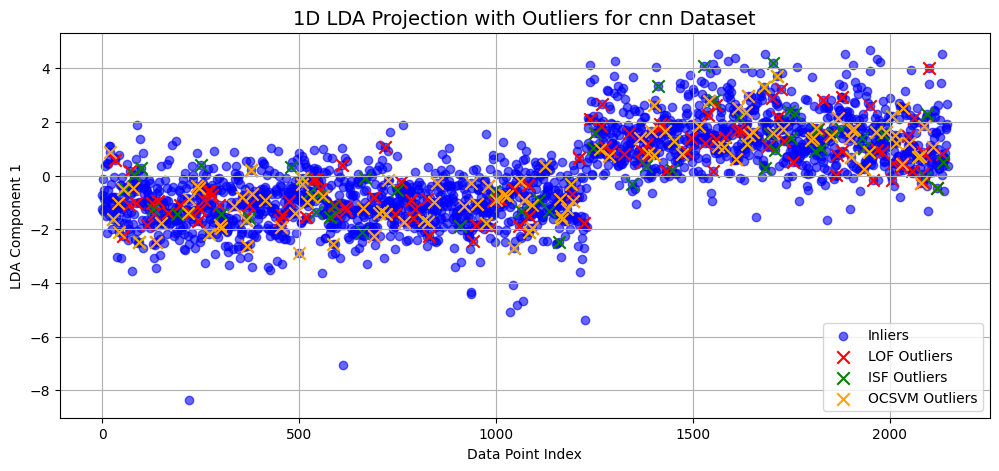

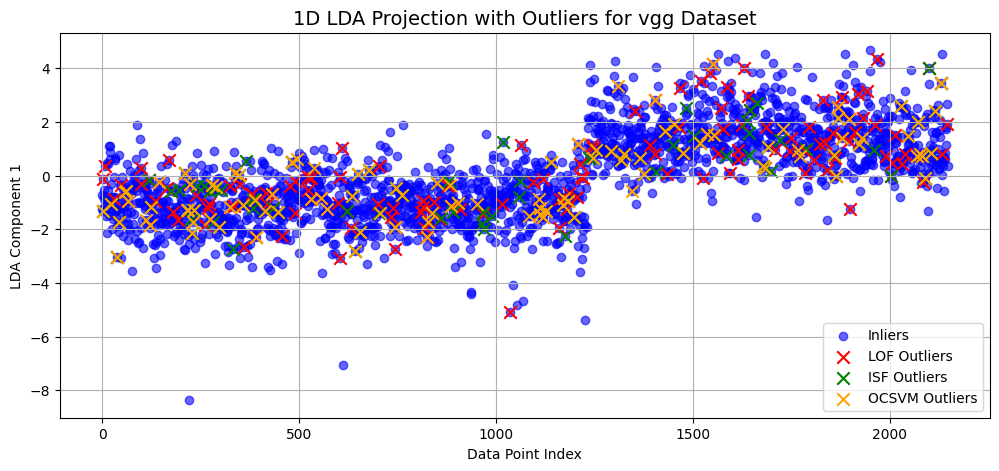

In [ ]:
datasets = ['full', 'selected', 'pca', 'lda', 'cnn', 'vgg']
for dataset_name in datasets:
    plot_outliers_1d(final_outliers[dataset_name])

In [ ]:
# Applying PCA for 2D visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(x_selected)

# Plotting function with 3 subplots for ISF, LOF, and OCSVM
def plot_outliers_2D(outliers_dict):
    # Retrieve the outliers for each method
    lof_outliers = list(outliers_dict["LOF"])
    isf_outliers = list(outliers_dict["ISF"])
    ocsvm_outliers = list(outliers_dict["OCSVM"])

    # Create a figure with 3 subplots
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f"Outliers for {dataset_name} Dataset", fontsize=16)

    # Helper to plot each method's outliers
    def plot_subplot(ax, method, outlier_idx):
        labels = np.ones(x_selected.shape[0])
        labels[outlier_idx] = -1
        ax.scatter(X_pca[labels == 1, 0], X_pca[labels == 1, 1], label='Inliers', alpha=0.6)
        ax.scatter(X_pca[labels == -1, 0], X_pca[labels == -1, 1], label='Outliers', color='red', alpha=0.6)
        ax.set_title(f"{method} Outliers")
        ax.set_xlabel("PCA 1")
        ax.set_ylabel("PCA 2")
        ax.legend()
        ax.grid(True)

    # Plot ISF outliers
    plot_subplot(axs[0], "ISF", isf_outliers)

    # Plot LOF outliers
    plot_subplot(axs[1], "LOF", lof_outliers)

    # Plot OCSVM outliers
    plot_subplot(axs[2], "OCSVM", ocsvm_outliers)

    # Display the plot
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

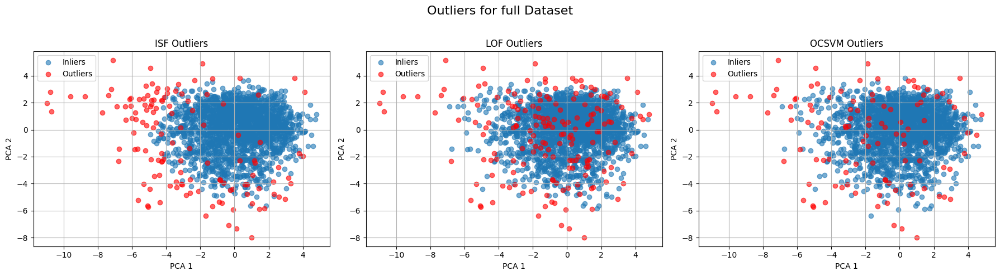

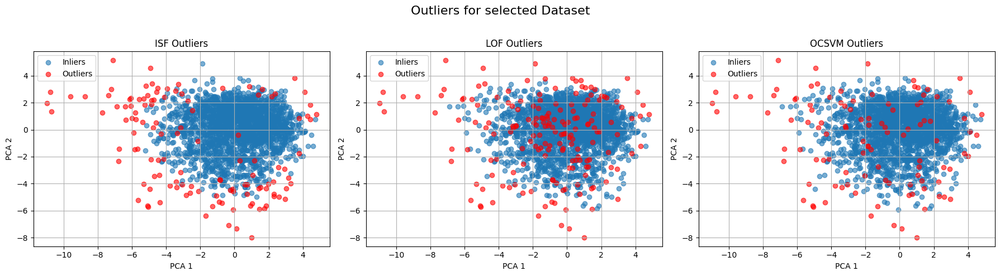

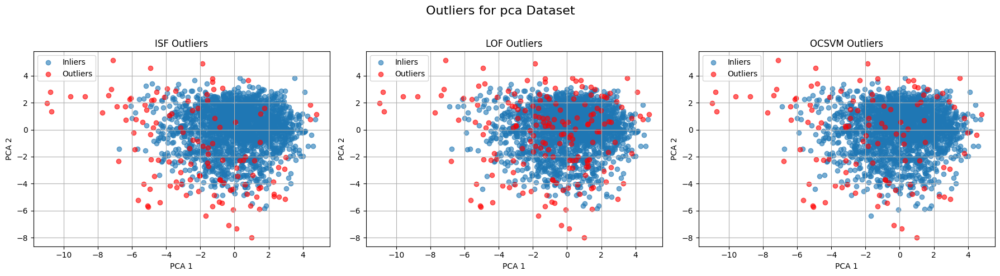

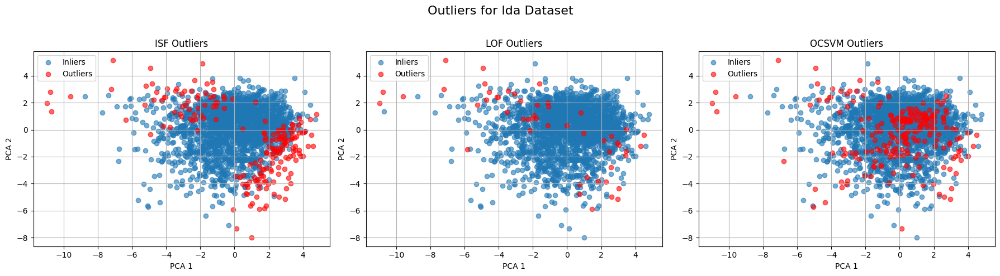

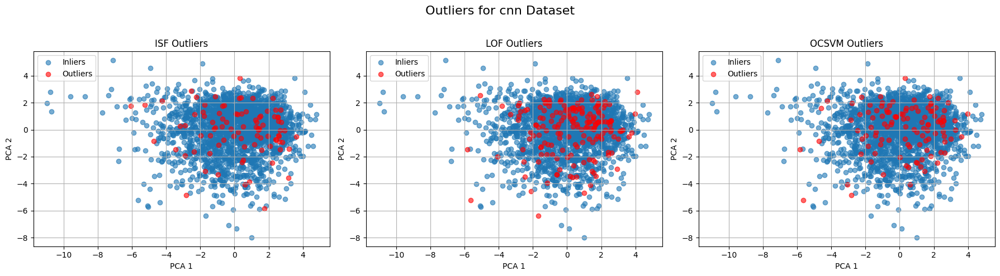

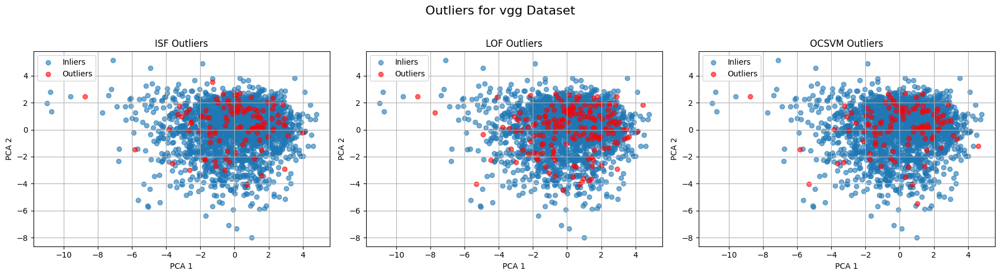

In [ ]:
datasets = ['full', 'selected', 'pca', 'lda', 'cnn', 'vgg']
for dataset_name in datasets:
    plot_outliers_2D(final_outliers[dataset_name])

In [ ]:
# Applying PCA for 3D visualization
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(x_selected)

# Plotting function with 3 subplots for ISF, LOF, and OCSVM in 3D
def plot_outliers_3d(outliers_dict):
    # Retrieve the outliers for each method
    lof_outliers = list(outliers_dict["LOF"])
    isf_outliers = list(outliers_dict["ISF"])
    ocsvm_outliers = list(outliers_dict["OCSVM"])

    # Create a figure with 3 subplots for 3D plots
    fig = plt.figure(figsize=(18, 5))
    fig.suptitle(f"3D Outliers for {dataset_name} Dataset", fontsize=16)

    # Helper function to plot each method's outliers in 3D
    def plot_subplot_3d(ax, method, outlier_idx):
        labels = np.ones(x_selected.shape[0])
        labels[outlier_idx] = -1
        ax.scatter(X_pca_3d[labels == 1, 0], X_pca_3d[labels == 1, 1], X_pca_3d[labels == 1, 2], label='Inliers', alpha=0.6)
        ax.scatter(X_pca_3d[labels == -1, 0], X_pca_3d[labels == -1, 1], X_pca_3d[labels == -1, 2], label='Outliers', color='red', alpha=0.6)
        ax.set_title(f"{method} Outliers")
        ax.set_xlabel("PCA 1")
        ax.set_ylabel("PCA 2")
        ax.set_zlabel("PCA 3")
        ax.legend()
        ax.grid(True)

    # Create three 3D subplots
    ax1 = fig.add_subplot(131, projection='3d')
    ax2 = fig.add_subplot(132, projection='3d')
    ax3 = fig.add_subplot(133, projection='3d')

    # Plot ISF outliers
    plot_subplot_3d(ax1, "ISF", isf_outliers)

    # Plot LOF outliers
    plot_subplot_3d(ax2, "LOF", lof_outliers)

    # Plot OCSVM outliers
    plot_subplot_3d(ax3, "OCSVM", ocsvm_outliers)

    # Display the plot
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

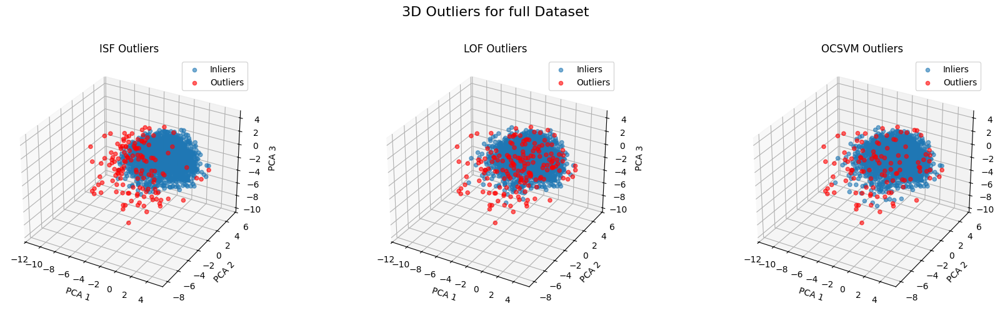

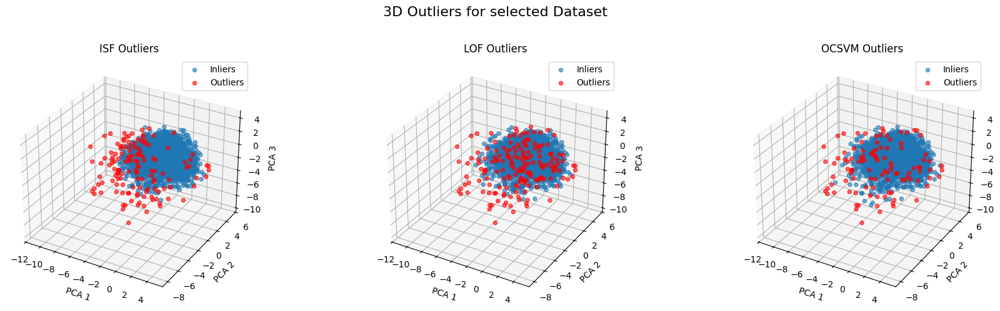

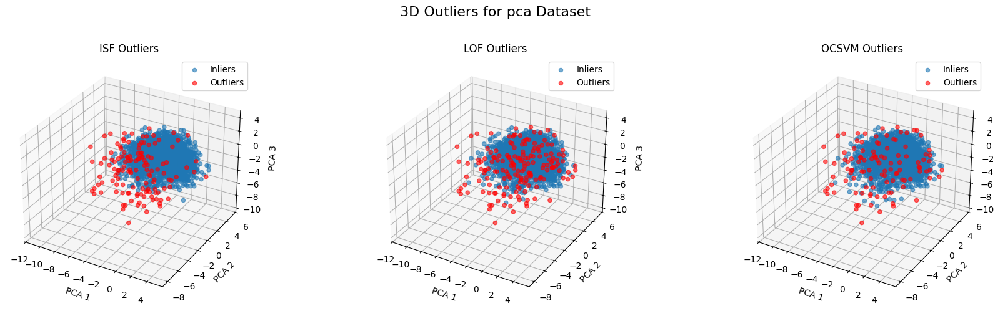

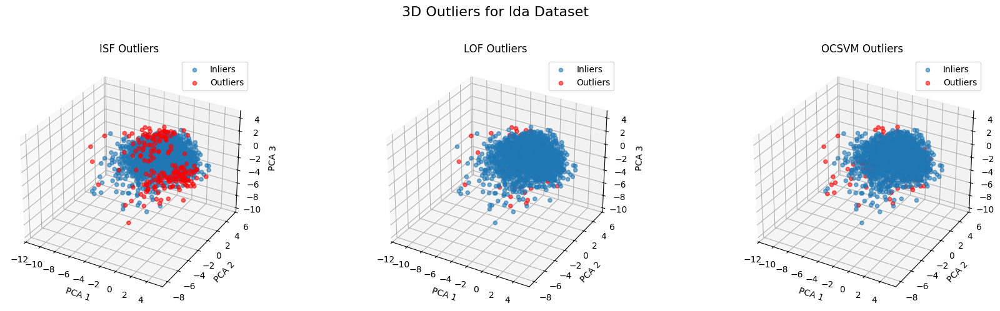

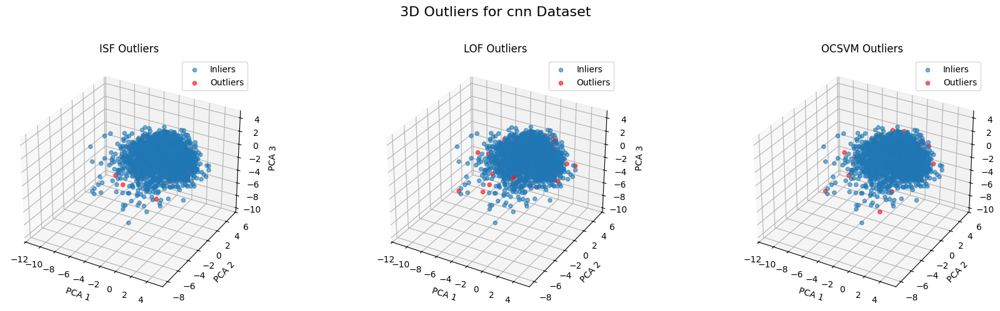

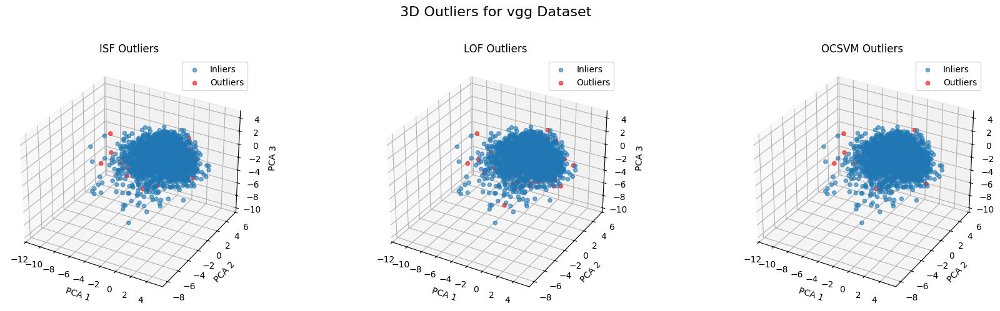

In [ ]:
datasets = ['full', 'selected', 'pca', 'lda', 'cnn', 'vgg']
for dataset_name in datasets:
    plot_outliers_3d(final_outliers[dataset_name])

In [ ]:
# Interserction of LOF and ISF for full_dataset and selected_dataset
full_outliers = set(final_outliers['full']['LOF']).intersection(final_outliers['full']['ISF'])
selected_outliers = set(final_outliers['selected']['LOF']).intersection(final_outliers['selected']['ISF'])

In [ ]:
# Common outliers between full_outliers and selected_outliers
outliers = full_outliers.intersection(selected_outliers)
len(outliers)

69

## Clustering object

In [ ]:
class ClusteringEvaluator:
    def __init__(self, X):
        """Initialize with dataset X."""
        self.X = X

        # Default parameters
        self.kmeans_params = {"n_clusters": 2, "random_state": 42}
        self.dbscan_params = {"eps": 0.5, "min_samples": 5}
        self.em_params = {"n_components": 3, "random_state": 42}

        # Initialize models
        self.kmeans = KMeans(**self.kmeans_params)
        self.dbscan = DBSCAN(**self.dbscan_params)
        self.em = GaussianMixture(**self.em_params)

    def evaluate_clustering(self, labels):
        """Evaluate clustering performance and return metrics."""
        if len(set(labels)) <= 1:  # Invalid clustering (all points in one cluster)
            return {
                "Silhouette Score": None,
                "Calinski-Harabasz Index": None,
                "Davies-Bouldin Index": None,
            }

        return {
            "Silhouette Score": silhouette_score(self.X, labels),
            "Calinski-Harabasz Index": calinski_harabasz_score(self.X, labels),
            "Davies-Bouldin Index": davies_bouldin_score(self.X, labels),
        }

    def cluster_kmeans(self, kmeans_params=None, ret_predict=False):
        """Perform KMeans clustering and return metrics or cluster labels."""
        if kmeans_params:
            self.kmeans_params = kmeans_params

        self.kmeans = KMeans(**self.kmeans_params)
        labels = self.kmeans.fit_predict(self.X)

        return labels,self.evaluate_clustering(labels) if ret_predict else self.evaluate_clustering(labels)

    def cluster_dbscan(self, dbscan_params=None, ret_predict=False):
        """Perform DBSCAN clustering and return metrics or cluster labels."""
        if dbscan_params:
            self.dbscan_params = dbscan_params

        self.dbscan = DBSCAN(**self.dbscan_params)
        labels = self.dbscan.fit_predict(self.X)
        #print number of clusters
        print('Number of Clusters: ',np.unique(labels))

        return labels,self.evaluate_clustering(labels)  if ret_predict else self.evaluate_clustering(labels)

    def cluster_em(self, em_params=None, ret_predict=False):
        """Perform EM (Gaussian Mixture) clustering and return metrics or cluster labels."""
        if em_params:
            self.em_params = em_params

        self.em = GaussianMixture(**self.em_params)
        labels = self.em.fit_predict(self.X)
        return labels,self.evaluate_clustering(labels) if ret_predict else self.evaluate_clustering(labels)

### Load and prepare the dataset




In [ ]:
# Set paths
full_dataset_dir =  "/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/Pistachio_28_Features_Dataset/Pistachio_28_Features_Dataset.xlsx"
selected_features_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/pistachio_df_cleaned.xlsx'
custom_cnn_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/features_custom2.npy'
vgg_features_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/features_VGG.npy'
labels_dir = '/content/drive/My Drive/Algonquin/Advanced Machine Learning/Project/Pistachio_Image_Dataset/labels.npy'


In [ ]:
# Load the datasets
full_dataset = pd.read_excel(full_dataset_dir)
selected_features = pd.read_excel(selected_features_dir)
custom_cnn = np.load(custom_cnn_dir)
vgg_features = np.load(vgg_features_dir)
labels = np.load(labels_dir)

In [ ]:
# Preprocess feature data
# Full dataset
preprocessor_full_dataset = DataPreprocessor(full_dataset)
preprocessor_full_dataset.standardize_data()
x_full_stan,_ = preprocessor_full_dataset.get_processed_data()
# PCA
preprocessor_full_dataset.apply_pca()
x_pca, _ = preprocessor_full_dataset.get_processed_data()
# Selected features
preprocessor_selected_features = DataPreprocessor(selected_features)
preprocessor_selected_features.standardize_data()
x_selected_stan, y = preprocessor_selected_features.get_processed_data()
# LDA
preprocessor_selected_features.apply_lda()
x_lda, _ = preprocessor_selected_features.get_processed_data()

# Normalized
# Full dataset
preprocessor_full_dataset = DataPreprocessor(full_dataset)
preprocessor_full_dataset.normalize_data()
x_full_norm,_ = preprocessor_full_dataset.get_processed_data()

# Selected features
preprocessor_selected_features = DataPreprocessor(selected_features)
preprocessor_selected_features.normalize_data()
x_selected_norm, _ = preprocessor_selected_features.get_processed_data()

In [ ]:
# temp model for evaluating the effect of deleting outliers
temp = ClusteringEvaluator(x_full_stan)
print(temp.cluster_kmeans())
print(temp.cluster_dbscan())
print(temp.cluster_em())

(array([0, 0, 0, ..., 1, 1, 0], dtype=int32), {'Silhouette Score': np.float64(0.19064553143396604), 'Calinski-Harabasz Index': np.float64(532.6603795681318), 'Davies-Bouldin Index': np.float64(1.8758713360148467)})
Number of Clusters:  [-1]
(array([-1, -1, -1, ..., -1, -1, -1]), {'Silhouette Score': None, 'Calinski-Harabasz Index': None, 'Davies-Bouldin Index': None})
Number of Clusters:  [0 1 2]
(array([0, 0, 2, ..., 1, 1, 0]), {'Silhouette Score': np.float64(0.10793214994093542), 'Calinski-Harabasz Index': np.float64(290.2380467300918), 'Davies-Bouldin Index': np.float64(2.2627088351153146)})


In [ ]:
# Delete outliers from all the dataset
x_full_stan = np.delete(x_full_stan, list(outliers), axis=0)
y = np.delete(y, list(outliers), axis=0)

x_full_norm = np.delete(x_full_norm, list(outliers), axis=0)

x_selected_stan = np.delete(x_selected_stan, list(outliers), axis=0)

x_selected_norm = np.delete(x_selected_norm, list(outliers), axis=0)

x_pca = np.delete(x_pca, list(outliers), axis=0)
x_lda = np.delete(x_lda, list(outliers), axis=0)

custom_cnn = np.delete(custom_cnn, list(outliers), axis=0)
vgg_features = np.delete(vgg_features, list(outliers), axis=0)

In [ ]:
# temp model for evaluating the effect of deleting outliers
temp = ClusteringEvaluator(x_full_stan)
print(temp.cluster_kmeans())
print(temp.cluster_dbscan())
print(temp.cluster_em())

(array([1, 1, 1, ..., 0, 0, 1], dtype=int32), {'Silhouette Score': np.float64(0.1878857946417141), 'Calinski-Harabasz Index': np.float64(540.0749497421411), 'Davies-Bouldin Index': np.float64(1.8779396297995294)})
Number of Clusters:  [-1]
(array([-1, -1, -1, ..., -1, -1, -1]), {'Silhouette Score': None, 'Calinski-Harabasz Index': None, 'Davies-Bouldin Index': None})
(array([2, 2, 0, ..., 1, 1, 2]), {'Silhouette Score': np.float64(0.11158160988268108), 'Calinski-Harabasz Index': np.float64(300.5243083158565), 'Davies-Bouldin Index': np.float64(2.1085070200548848)})


### Tuning DBSCAN

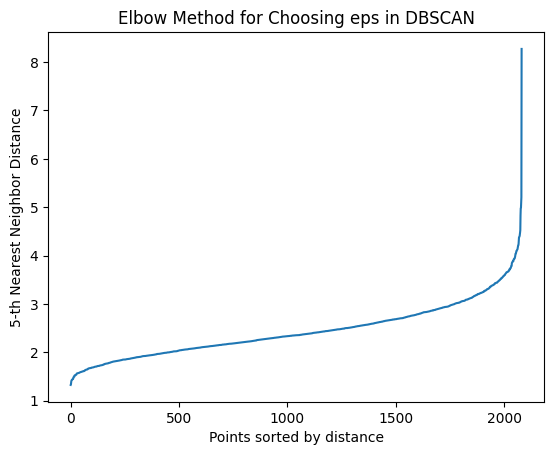

In [ ]:
k = 5  # Typically set to min_samples
nbrs = NearestNeighbors(n_neighbors=k).fit(x_full_stan)  # X is your dataset
distances, indices = nbrs.kneighbors(x_full_stan)
distances = np.sort(distances[:, k-1])  # Sort the k-th nearest distances

plt.plot(distances)
plt.xlabel("Points sorted by distance")
plt.ylabel(f"{k}-th Nearest Neighbor Distance")
plt.title("Elbow Method for Choosing eps in DBSCAN")
plt.show()

In [ ]:
temp.cluster_dbscan({"eps": 4, "min_samples": 5})

Number of Clusters:  [-1  0]


(array([0, 0, 0, ..., 0, 0, 0]),
 {'Silhouette Score': np.float64(0.285057410638184),
  'Calinski-Harabasz Index': np.float64(4.850164682963138),
  'Davies-Bouldin Index': np.float64(2.2638247541134118)})

In [ ]:
temp.cluster_dbscan({"eps": 5, "min_samples": 100})

Number of Clusters:  [-1  0]


(array([0, 0, 0, ..., 0, 0, 0]),
 {'Silhouette Score': np.float64(0.4186466901515479),
  'Calinski-Harabasz Index': np.float64(18.394726613848597),
  'Davies-Bouldin Index': np.float64(1.0306768291283643)})

In [ ]:
temp.cluster_dbscan({"eps": 4, "min_samples": 3})

Number of Clusters:  [-1  0]


(array([0, 0, 0, ..., 0, 0, 0]),
 {'Silhouette Score': np.float64(0.285057410638184),
  'Calinski-Harabasz Index': np.float64(4.850164682963138),
  'Davies-Bouldin Index': np.float64(2.2638247541134118)})

In [ ]:
temp.cluster_dbscan({"eps": 4, "min_samples": 300})

Number of Clusters:  [-1  0]


(array([-1,  0,  0, ...,  0,  0,  0]),
 {'Silhouette Score': np.float64(0.2289787068089479),
  'Calinski-Harabasz Index': np.float64(182.89231440531523),
  'Davies-Bouldin Index': np.float64(2.7937507997297533)})

Best Parameters = {"eps": 5, "min_samples": 100}

### Fine Tuning EM

In [ ]:
temp.cluster_em({"n_components": 2})

Number of Clusters:  [0 1]


(array([1, 1, 0, ..., 0, 0, 1]),
 {'Silhouette Score': np.float64(0.1327689184539562),
  'Calinski-Harabasz Index': np.float64(261.69668072380426),
  'Davies-Bouldin Index': np.float64(2.6881540140351845)})

In [ ]:
temp.cluster_em({"n_components": 3})

Number of Clusters:  [0 1 2]


(array([1, 1, 0, ..., 2, 2, 1]),
 {'Silhouette Score': np.float64(0.11904749796875184),
  'Calinski-Harabasz Index': np.float64(327.7466794427179),
  'Davies-Bouldin Index': np.float64(2.1579337433384107)})

In [ ]:
temp.cluster_em({"n_components": 4})

Number of Clusters:  [0 1 2 3]


(array([3, 3, 2, ..., 0, 0, 1]),
 {'Silhouette Score': np.float64(0.09934637385962328),
  'Calinski-Harabasz Index': np.float64(288.38158782420913),
  'Davies-Bouldin Index': np.float64(2.226036568618444)})

Best parameter is Number of component = 2

### Training and evaluation



In [ ]:
#Dictionary of all datasets
datasets = {
    "full standardized": x_full_stan,
    "full normalized": x_full_norm,
    "selected standardized": x_selected_stan,
    "selected normalized": x_selected_norm,
    "pca": x_pca,
    "lda": x_lda,
    "cnn": custom_cnn,
    "vgg": vgg_features
}



In [ ]:
# Initialize dictionaries to store results
clustering_evaluations = {}
clustering_labels = {}

# Train models on each dataset
for dataset_name, X in datasets.items():
    print(f"Training on {dataset_name} dataset...")

    evaluator = ClusteringEvaluator(X)

    # KMeans
    kmeans_labels, kmeans_eval = evaluator.cluster_kmeans(ret_predict=True)

    # DBSCAN
    dbscan_labels, dbscan_eval = evaluator.cluster_dbscan( dbscan_params={"eps": 5, "min_samples": 100},ret_predict=True)

    # EM (Gaussian Mixture)
    em_labels, em_eval = evaluator.cluster_em({"n_components": 2},ret_predict=True)

    # Store evaluations
    clustering_evaluations[dataset_name] = {
        "KMeans": kmeans_eval,
        "DBSCAN": dbscan_eval,
        "EM": em_eval
    }

    # Store cluster labels
    clustering_labels[dataset_name] = {
        "KMeans": kmeans_labels,
        "DBSCAN": dbscan_labels,
        "EM": em_labels
    }


Training on full standardized dataset...
Number of Clusters:  [-1  0]
Training on full normalized dataset...
Number of Clusters:  [0]
Training on selected standardized dataset...
Number of Clusters:  [0]
Training on selected normalized dataset...
Number of Clusters:  [0]
Training on pca dataset...
Number of Clusters:  [-1  0]
Training on lda dataset...
Number of Clusters:  [0]
Training on cnn dataset...
Number of Clusters:  [-1]
Training on vgg dataset...
Number of Clusters:  [-1]


In [ ]:
# clustering_evaluations to dataframe
clustering_evaluations_df = pd.DataFrame(clustering_evaluations)
clustering_evaluations_df

,full standardized,full normalized,selected standardized,selected normalized,pca,lda,cnn,vgg
KMeans,"{'Silhouette Score': 0.1878857946417141, 'Cali...","{'Silhouette Score': 0.23630086619804483, 'Cal...","{'Silhouette Score': 0.18801317689908845, 'Cal...","{'Silhouette Score': 0.32920513072028684, 'Cal...","{'Silhouette Score': 0.18788579464171404, 'Cal...","{'Silhouette Score': 0.6137140934357294, 'Cali...","{'Silhouette Score': 0.09981833, 'Calinski-Har...","{'Silhouette Score': 0.05456805, 'Calinski-Har..."
DBSCAN,"{'Silhouette Score': 0.4186466901515479, 'Cali...","{'Silhouette Score': None, 'Calinski-Harabasz ...","{'Silhouette Score': None, 'Calinski-Harabasz ...","{'Silhouette Score': None, 'Calinski-Harabasz ...","{'Silhouette Score': 0.4186466901515479, 'Cali...","{'Silhouette Score': None, 'Calinski-Harabasz ...","{'Silhouette Score': None, 'Calinski-Harabasz ...","{'Silhouette Score': None, 'Calinski-Harabasz ..."
EM,"{'Silhouette Score': 0.13368993373364543, 'Cal...","{'Silhouette Score': 0.2100941478088052, 'Cali...","{'Silhouette Score': 0.16919002536838473, 'Cal...","{'Silhouette Score': 0.28947150022386714, 'Cal...","{'Silhouette Score': 0.1336899337336454, 'Cali...","{'Silhouette Score': 0.6133823411823612, 'Cali...","{'Silhouette Score': 0.09920567, 'Calinski-Har...","{'Silhouette Score': 0.097932495, 'Calinski-Ha..."


In [ ]:
# Applying PCA for 2D visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(x_selected_stan)

# Plot reference dataset with ground truth labels
def plot_reference_2D(y):
    unique_labels = np.unique(y)
    colors = plt.cm.get_cmap("tab10", len(unique_labels))

    plt.figure(figsize=(7, 5))
    for i, label in enumerate(unique_labels):
        plt.scatter(
            X_pca[y == label, 0],
           X_pca[y == label, 1],
            label=f'Class {label}',
            alpha=0.6,
            color=colors(i)
        )

    plt.title("Reference Data (True Labels)")
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.legend()
    plt.grid(True)
    plt.show()


# Plotting function with 3 subplots for KMeans, DBSCAN, and EM
def plot_clusters_2D(cluster_labels_dict, dataset_name):
    # Retrieve the cluster labels for each method
    kmeans_labels = cluster_labels_dict["KMeans"]
    dbscan_labels = cluster_labels_dict["DBSCAN"]
    em_labels = cluster_labels_dict["EM"]

    # Create a figure with 3 subplots
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f"Clustering Results for {dataset_name} Dataset", fontsize=16)

    # Helper to plot each method's clustering results
    def plot_subplot(ax, method, labels):
        unique_labels = np.unique(labels)
        colors = plt.cm.get_cmap("tab10", len(unique_labels))

        for i, label in enumerate(unique_labels):
            ax.scatter(
                X_pca[labels == label, 0],
                X_pca[labels == label, 1],
                label=f'Cluster {label}',
                alpha=0.6,
                color=colors(i) if label != -1 else "black"
            )

        ax.set_title(f"{method} Clusters")
        ax.set_xlabel("PCA 1")
        ax.set_ylabel("PCA 2")
        ax.legend()
        ax.grid(True)

    # Plot KMeans clusters
    plot_subplot(axs[0], "KMeans", kmeans_labels)

    # Plot DBSCAN clusters
    plot_subplot(axs[1], "DBSCAN", dbscan_labels)

    # Plot EM clusters
    plot_subplot(axs[2], "EM", em_labels)

    # Display the plot
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

<ipython-input-64-cd28a777a6ec>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(unique_labels))


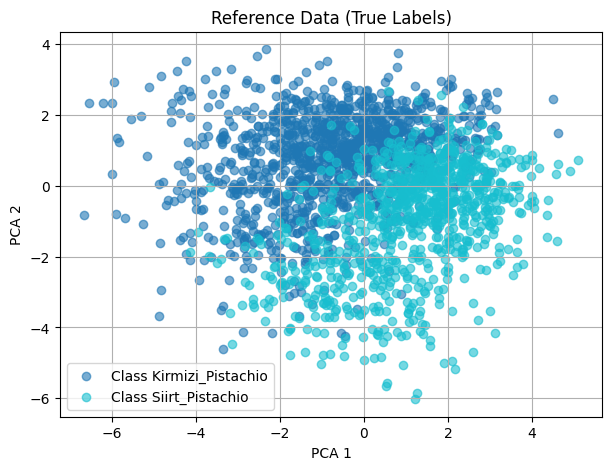

<ipython-input-64-cd28a777a6ec>:42: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap("tab10", len(unique_labels))


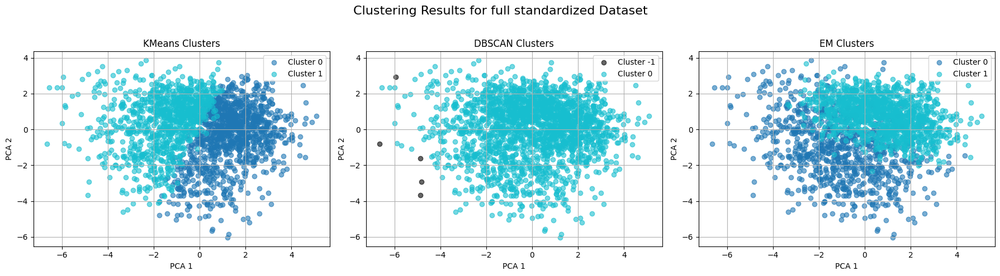

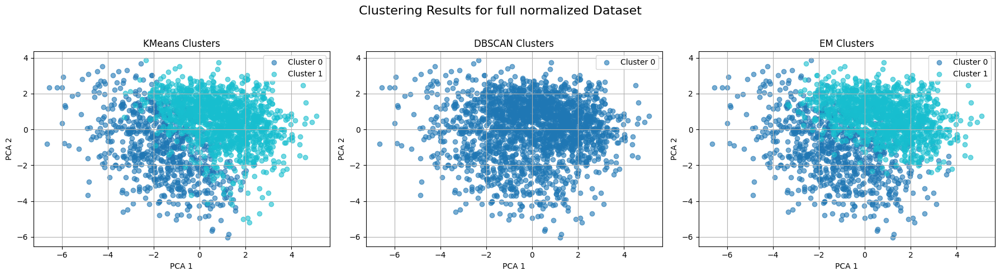

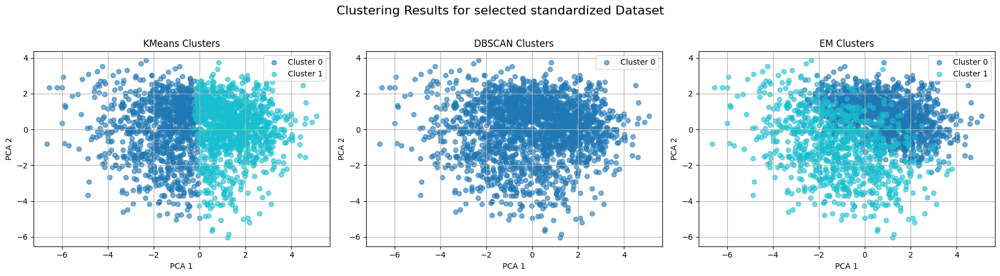

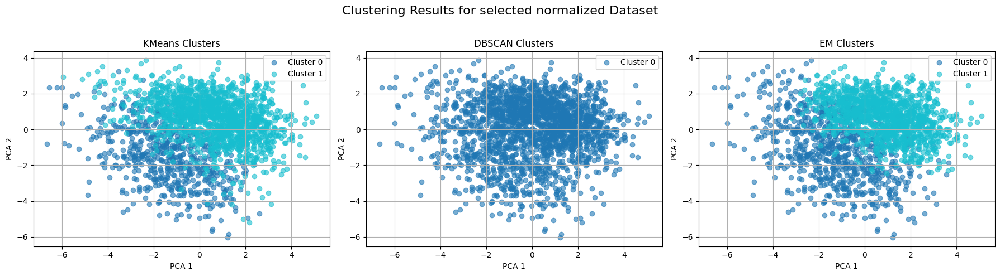

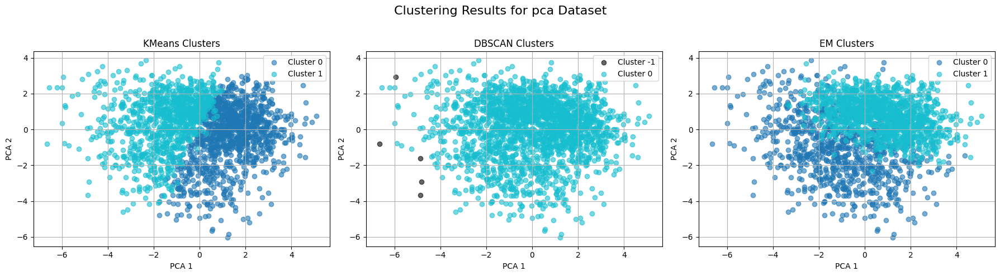

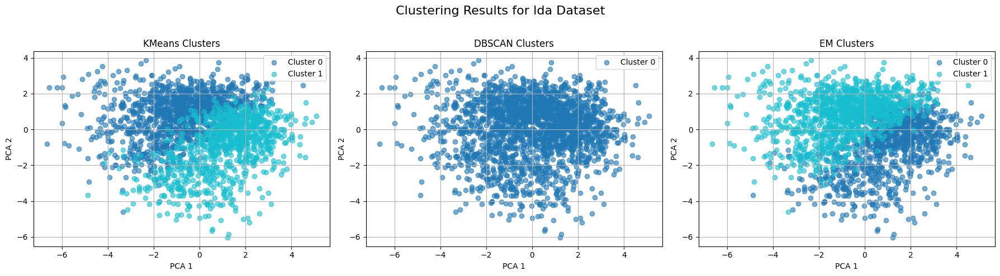

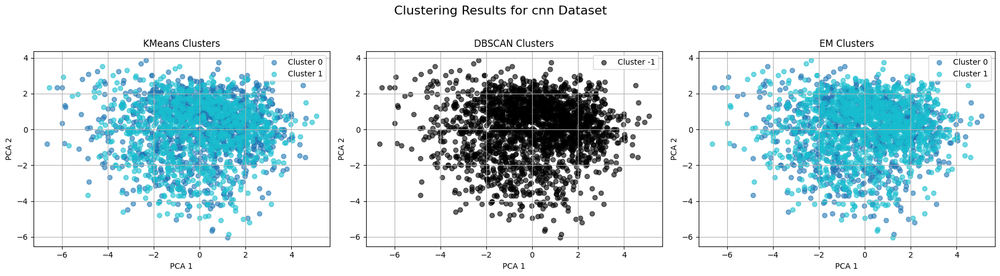

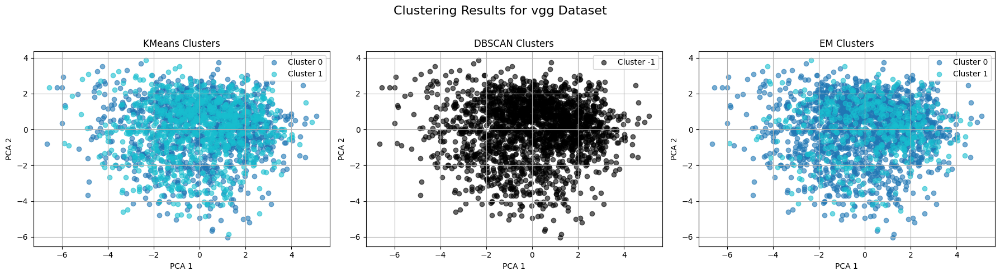

In [ ]:
plot_reference_2D(y)
for dataset_name, labels in clustering_labels.items():
    plot_clusters_2D(labels, dataset_name)